<a href="https://colab.research.google.com/github/aqn96/SemanticSounds/blob/master/%20%20%20%20recommender_src/music_recommender_sbert.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
# Get data from drive
# Go to file ==> drive ==> MyDrive ==> CollabNotebooks

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
!pip install thefuzz[speedup]
!pip install fuzzywuzzy python-Levenshtein
!pip install pandas rapidfuzz
!pip install recordlinkage
!pip install metaphone
!pip install umap-learn
!pip install hdbscan

# ---------------------------- Setup ---------------------------

# Install required packages
!pip install sentence-transformers umap-learn plotly scikit-learn nltk gensim --quiet

# ---------------------------- Import Necessary Libraries ----------------------------

import pandas as pd
import re
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from gensim.models import Word2Vec
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import DBSCAN, KMeans, AgglomerativeClustering
from sklearn.metrics import silhouette_score
import umap
import plotly.express as px
import matplotlib.pyplot as plt
import numpy as np
from itertools import product

# ---------------------------- Download NLTK Resources ----------------------------

nltk.download('stopwords', quiet=True)
nltk.download('wordnet', quiet=True)
nltk.download('omw-1.4', quiet=True)

# ---------------------------- Initialize Preprocessing Tools ----------------------------

# Initialize lemmatizer. Assign similar words to one thing to avoid confusing model.
lemmatizer = WordNetLemmatizer()

# Define stopwords. Avoid confusing the model.
stop_words = set(stopwords.words('english'))

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 35.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 162.6/162.6 kB 7.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 926.9/926.9 kB 18.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for metaphone: filename=Metaphone-0.6-py3-none-any.whl size=13901 sha256=53b6cc832eea34dace62725c117326defd84b7e8df31c1f2c70a494d89c606a9
  Stored in directory: /root/.cache/pip/wheels/23/dd/1d/6cdd346605db62bde1f60954155e9ce48f4681c243f265b704
Successfully built metaphone
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.8/88.8 kB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.9/56.9 kB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 58.1 MB/s eta 0:00:00


In [4]:
# Mass Import

# Import Essentials
import os
import pandas as pd
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import seaborn as sns
import numpy as np

# Import libraries for modeling and evaluation
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN # import DBSCAN class
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant


# Import TensorFlow and Keras
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

# Feature Importance using SHAP
import shap

# Import XGBoost and LightGBM
import xgboost as xgb
import lightgbm as lgb

# Ignore warnings for clean output
import warnings
warnings.filterwarnings('ignore')

# fuzzy matching
from thefuzz import process
from sklearn.metrics.pairwise import cosine_similarity


/usr/local/lib/python3.10/dist-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


In [5]:
time_songlyrics = 'merged_data2.csv'

In [6]:
df1 = pd.read_csv(f'/content/drive/MyDrive/Colab Notebooks/{time_songlyrics}')
print(df1)

      level_0  level_1  track_name_similarity  artist_similarity  \
0           1    33057                    1.0                1.0   
1           7     3259                    1.0                1.0   
2           8    32355                    1.0                1.0   
3          12    34956                    1.0                1.0   
4          19    21342                    1.0                1.0   
...       ...      ...                    ...                ...   
2006     9918    51100                    1.0                1.0   
2007     9919    47344                    1.0                1.0   
2008     9926     3844                    1.0                1.0   
2009     9928    14451                    1.0                1.0   
2010     9940    31412                    1.0                1.0   

                                 Track URI  \
0     spotify:track:0NpvdCO506uO58D4AbKzki   
1     spotify:track:7LVHVU3tWfcxj5aiPFEW4Q   
2     spotify:track:1s2khOWzC99udpUaPICLJI   

In [7]:
# Remove duplicate song names by the same artist. Do this through fuzzy matching.


# Import fuzzywuzzy
from fuzzywuzzy import fuzz  # Add this import

# Normalize song and artist names
def normalize_text(text):
    text = str(text).lower()  # Convert to lowercase
    text = re.sub(r'[^\w\s]', '', text)  # Remove punctuation
    return text

df1['song'] = df1['song'].apply(normalize_text)
df1['artist'] = df1['artist'].apply(normalize_text)

# Remove duplicates
df1 = df1.drop_duplicates(subset=['song', 'artist'])

# Further refine by fuzzy matching for near duplicates
def remove_near_duplicates(df):
    rows_to_drop = []
    for i in range(len(df)):
      for j in range(i + 1, len(df)):
          if df['artist'].iloc[i] == df['artist'].iloc[j]:
              if fuzz.ratio(df['song'].iloc[i], df['song'].iloc[j]) > 90:
                rows_to_drop.append(j)
    return df.drop(df.index[rows_to_drop]).reset_index(drop=True)

df1 = remove_near_duplicates(df1)

print(df1)

      level_0  level_1  track_name_similarity  artist_similarity  \
0           1    33057                    1.0                1.0   
1           7     3259                    1.0                1.0   
2           8    32355                    1.0                1.0   
3          12    34956                    1.0                1.0   
4          19    21342                    1.0                1.0   
...       ...      ...                    ...                ...   
1629     9895    13553                    1.0                1.0   
1630     9908      706                    1.0                1.0   
1631     9918    51100                    1.0                1.0   
1632     9919    47344                    1.0                1.0   
1633     9928    14451                    1.0                1.0   

                                 Track URI                       Track Name  \
0     spotify:track:0NpvdCO506uO58D4AbKzki                           Sherry   
1     spotify:track:7LVHV

In [8]:
# # ---------------------------- Initialize Preprocessing Tools ----------------------------

# lemmatizer = WordNetLemmatizer()
# stop_words = set(stopwords.words('english'))

# ---------------------------- Define the Enhanced Preprocessing Function ----------------------------

def preprocess_lyrics(text):
    """
    Preprocesses song lyrics by cleaning and standardizing the text.

    Parameters:
    - text (str): Raw song lyrics.

    Returns:
    - cleaned_text (str): Preprocessed lyrics.
    """
    # Remove text within parentheses
    text = re.sub(r'\([^)]*\)', '', text)

    # Convert to lowercase
    text = text.lower()

    # Replace line breaks with ' / ' to denote line separations
    text = re.sub(r'\n+', ' / ', text)

    # Remove special characters except essential punctuation
    text = re.sub(r'[^\w\s,?.!]', '', text)

    # Remove excessive repetitions (e.g., limit to 2)
    text = re.sub(r'\b(\w+)( \1){2,}', r'\1 \1', text)

    # Tokenize
    tokens = text.split()

    # Optional: Remove stopwords (commented out to preserve lyrical nuances)
    # tokens = [word for word in tokens if word not in stop_words]

    # Lemmatize
    tokens = [lemmatizer.lemmatize(word) for word in tokens]

    # Rejoin tokens
    cleaned_text = ' '.join(tokens)

    # Remove duplicate lines (assuming lines are separated by ' / ')
    lines = cleaned_text.split(' / ')
    seen = set()
    unique_lines = []
    for line in lines:
        if line not in seen:
            unique_lines.append(line)
            seen.add(line)
    cleaned_text = ' / '.join(unique_lines)

    return cleaned_text

# Preprocess lyrics
df1['clean_text'] = df1['text'].apply(preprocess_lyrics)

# Define the output Excel file name
output_file = 'song_lyrics_clustering_results.xlsx'

# Export the DataFrame to Excel
df1.to_excel(output_file, index=False, engine='openpyxl')  # You can use 'xlsxwriter' if preferred

In [9]:
# Count of how many songs in which time period by decades 1950s-2020s

# Convert the 'year' column to numeric, coercing errors to NaN
df1['Release Year'] = pd.to_numeric(df1['Release Year'], errors='coerce')

# Fill NaN values in the 'year' column with a placeholder (e.g., 0)
df1['Release Year'] = df1['Release Year'].fillna(0)

# Group songs by decade and count
def get_decade(year):
    if 1950 <= year < 1960:
        return "1950s"
    elif 1960 <= year < 1970:
        return "1960s"
    elif 1970 <= year < 1980:
        return "1970s"
    elif 1980 <= year < 1990:
        return "1980s"
    elif 1990 <= year < 2000:
        return "1990s"
    elif 2000 <= year < 2010:
        return "2000s"
    elif 2010 <= year < 2020:
        return "2010s"
    elif 2020 <= year < 2030:
        return "2020s"
    else:
        return "Other"

df1['decade'] = df1['Release Year'].apply(get_decade)
decade_counts = df1.groupby('decade')['song'].count()

# Print the counts
decade_counts

,song
decade,
1950s,2
1960s,14
1970s,53
1980s,54
1990s,1457
2000s,44
2010s,10


In [10]:
# Song distribution by release years

# Assuming df1 is already loaded and processed as in the provided code.

# Filter for the 1990s
nineties_songs = df1[df1['decade'] == '1990s']

# Count songs per year in the 1990s
yearly_counts_1990s = nineties_songs.groupby('Release Year')['song'].count()

# Print the result
print(yearly_counts_1990s)

Release Year
1990    1436
1991       4
1992       3
1993       1
1995       1
1996       2
1997       3
1998       4
1999       3
Name: song, dtype: int64


1950s: Birth of Rock 'n' Roll

    Key Genres: Rock 'n' Roll, Jazz, Blues, Country, Rhythm & Blues (R&B)
    Notable Artists: Elvis Presley, Chuck Berry, Little Richard, Ray Charles, Johnny Cash
    Global Influence: Post-WWII optimism spurred creativity; jazz and rock 'n' roll spread internationally, inspiring local adaptations.
    Technological Advancements: Emergence of 45 RPM records and portable radios made music more accessible.

1960s: Cultural Revolution

    Key Genres: Rock, Folk, Motown, Soul, Psychedelic Rock, British Invasion
    Notable Artists: The Beatles, Bob Dylan, The Rolling Stones, Aretha Franklin, Jimi Hendrix
    Global Influence: Anti-war movements and civil rights shaped music. British bands dominated, while global folk traditions gained recognition.
    Technological Advancements: Stereo recordings and improved amplification.

1970s: Rise of Diverse Genres

    Key Genres: Disco, Funk, Punk Rock, Reggae, Progressive Rock, Heavy Metal
    Notable Artists: Led Zeppelin, Bob Marley, Pink Floyd, Donna Summer, ABBA
    Global Influence: Disco fever took over globally; reggae spread from Jamaica, and punk became a cultural statement.
    Technological Advancements: Multi-track recording and synthesizers expanded musical possibilities.

1980s: MTV Era and Electronic Explosion

    Key Genres: Pop, Hip-Hop, Synthpop, New Wave, Glam Metal
    Notable Artists: Michael Jackson, Madonna, Prince, U2, Whitney Houston, Run-D.M.C.
    Global Influence: Music videos revolutionized global music marketing; African, Asian, and Latin American influences gained visibility.
    Technological Advancements: Drum machines, MIDI, compact discs (CDs).

1990s: Alternative and Global Fusion
Early 1990s (1990-1993): The End of an Era

    The End of an Era: The collapse of the Soviet Union and the end of the Cold War reshaped the global political landscape, influencing cultural expressions and global collaborations in music.
    Grunge Revolution:
        Description: The Seattle grunge scene redefined popular music with its raw sound and introspective lyrics.
        Key Bands: Nirvana, Pearl Jam, Soundgarden, Alice in Chains
    Dawn of the Internet Age:
        Description: The early internet began to emerge, changing how music was distributed and consumed.
        Impact: Introduced new platforms for music sharing and laid the groundwork for digital music's future.
    Hip-Hop's Rising Influence:
        Description: Hip-hop continued to grow, gaining mainstream recognition and expanding its cultural impact.
        Key Artists: Public Enemy, Dr. Dre, Snoop Dogg

Mid 1990s (1994-1996): Expansion and Mainstream Success

    Alternative Rock Expansion:
        Description: Alternative rock became a dominant genre, blending various styles and appealing to a broad audience.
        Key Bands: Radiohead, Red Hot Chili Peppers, The Smashing Pumpkins
    Hip-Hop Mainstream Breakthrough:
        Description: Hip-hop achieved significant commercial success and cultural prominence.
        Key Albums: Illmatic by Nas, Ready to Die by The Notorious B.I.G.
    Rise of Electronic Dance Music:
        Description: Electronic dance music (EDM) and rave culture began to gain international popularity.
        Key Trends: Techno, House, Trance
    Pop Diversification:
        Description: Pop music diversified with the emergence of new subgenres and fusion styles.
        Key Artists: Britney Spears, Backstreet Boys, Spice Girls

Late 1990s (1997-1999): Technological Advancements and Pop Culture Explosion

    The Dot-Com Boom:
        Description: Rapid technological advancement and economic growth fueled by the internet transformed the music industry.
        Impact: Facilitated online music distribution, marketing, and the rise of digital music platforms.

    Global Pop Culture Explosion:
        Description: The rise of boy bands, girl groups, and teen pop music dominated the global music scene.
        Key Acts: NSYNC, Destiny's Child, Westlife

    Youth Culture and Subcultures:
        Description: Youth culture was influenced by trends like hip-hop, rave culture, and alternative fashion.
        Key Movements: Skate Punk, Emo, Trip-Hop

    Emergence of Nu-Metal and Pop-Punk:
        Description: Genres like nu-metal and pop-punk began to gain traction, blending elements of metal, punk, and alternative rock.
        Key Bands: Korn, Limp Bizkit, Green Day, Blink-182

    Key Genres: Grunge, Hip-Hop, Britpop, R&B, Electronic Dance Music (EDM)

    Notable Artists: Nirvana, Tupac Shakur, The Notorious B.I.G., Spice Girls, Radiohead

    Global Influence: Rise of world music; K-pop began to grow in South Korea, and Latin music gained broader international appeal.

    Technological Advancements: Digital recording, rise of the internet, and early MP3s.

2000s: Digital Revolution

    Key Genres: Pop, Hip-Hop, Emo, Indie Rock, EDM
    Notable Artists: Beyoncé, Eminem, Coldplay, Shakira, Linkin Park
    Global Influence: Internet and social media democratized music distribution; collaborations between Western and global artists surged.
    Technological Advancements: MP3 players, iTunes, and music streaming began to replace physical formats.

2010s: Streaming and Global Connectivity

    Key Genres: Pop, Trap, K-pop, Latin Urban, EDM
    Notable Artists: Taylor Swift, Drake, BTS, Rosalía, Billie Eilish
    Global Influence: Streaming platforms (Spotify, YouTube) made global stars; K-pop (BTS), Latin music (Bad Bunny), and Afrobeat (Wizkid) dominated internationally.
    Technological Advancements: Algorithm-driven platforms and AI in music production.

2020s: Cross-Cultural Fusion

    Key Genres: Hyperpop, Afrobeats, Reggaeton, Indie Pop, Experimental
    Notable Artists: Olivia Rodrigo, The Weeknd, Bad Bunny, Burna Boy, Stray Kids
    Global Influence: Hybrid genres reflecting global interconnectedness; regional styles like Indian indie, Chinese pop, and African beats become mainstream.
    Technological Advancements: AI music, immersive sound experiences (spatial audio), and virtual concerts during the COVID-19 pandemic.

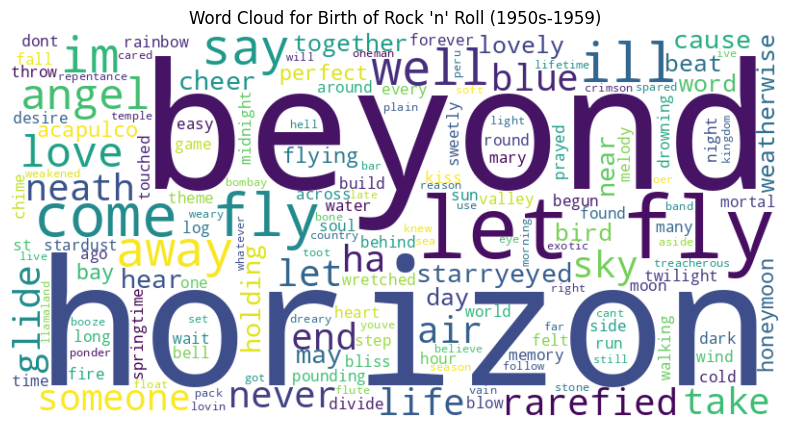

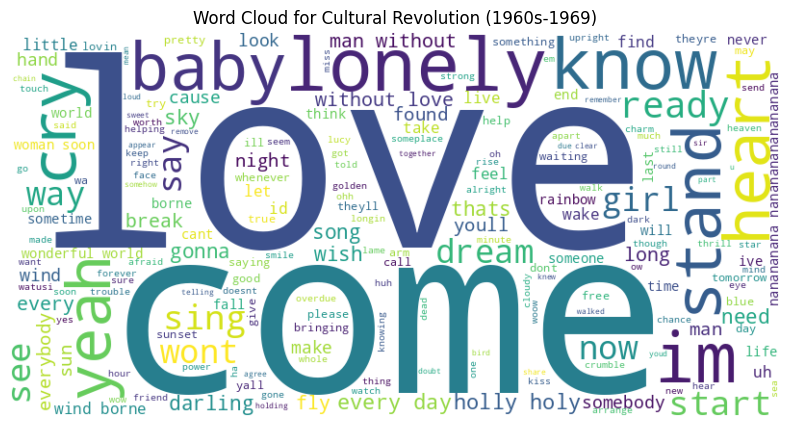

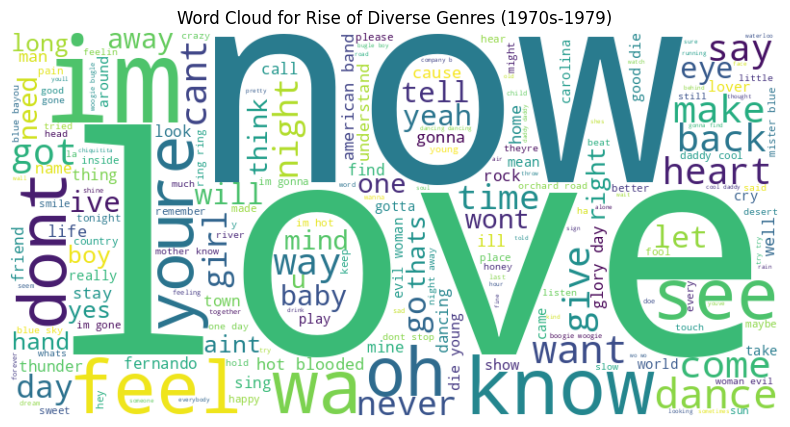

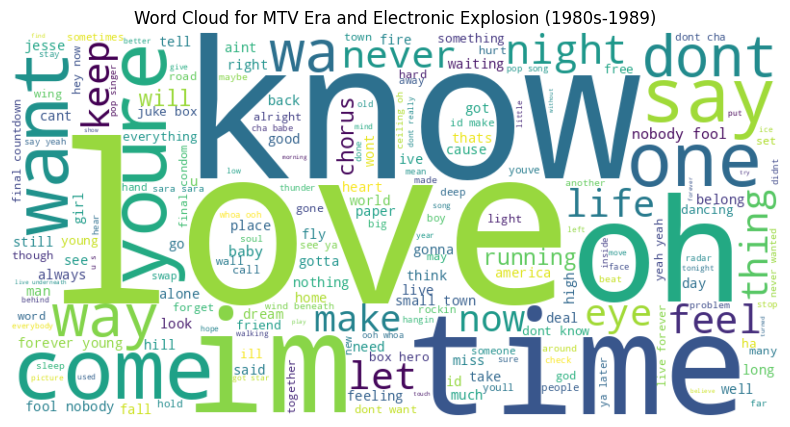

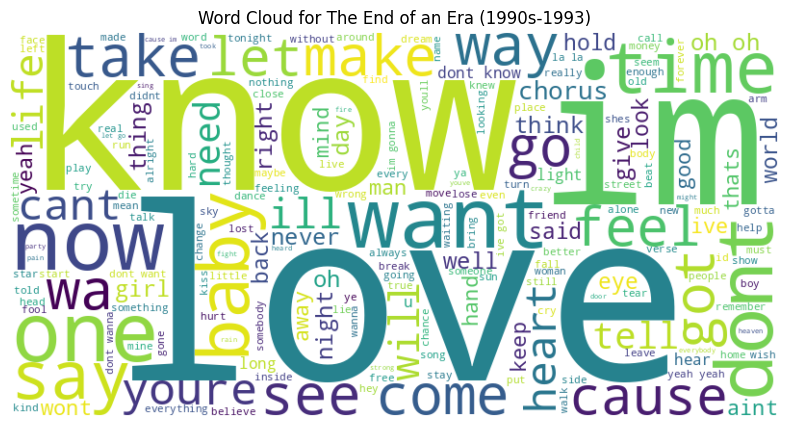

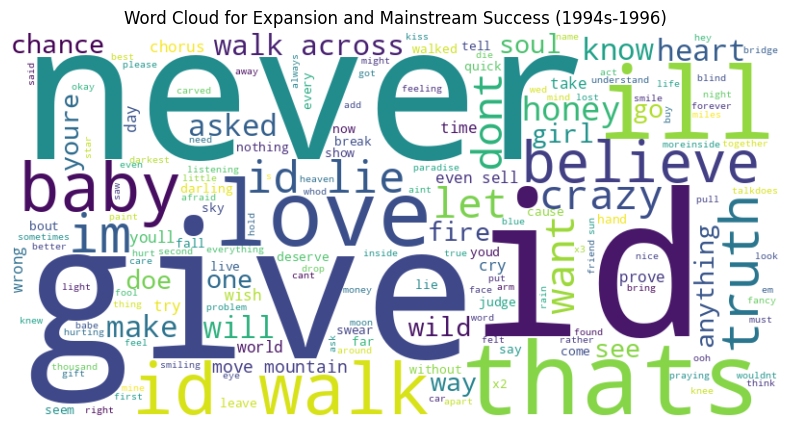

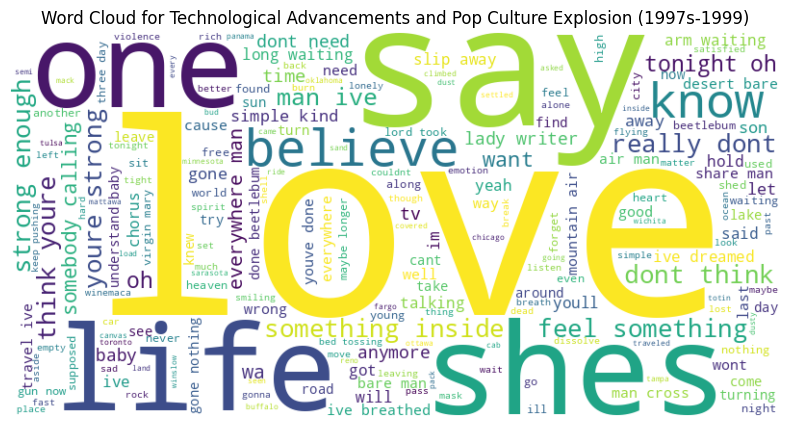

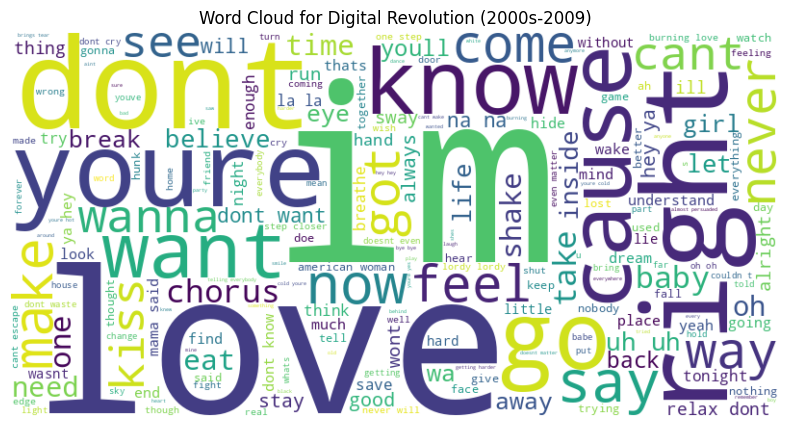

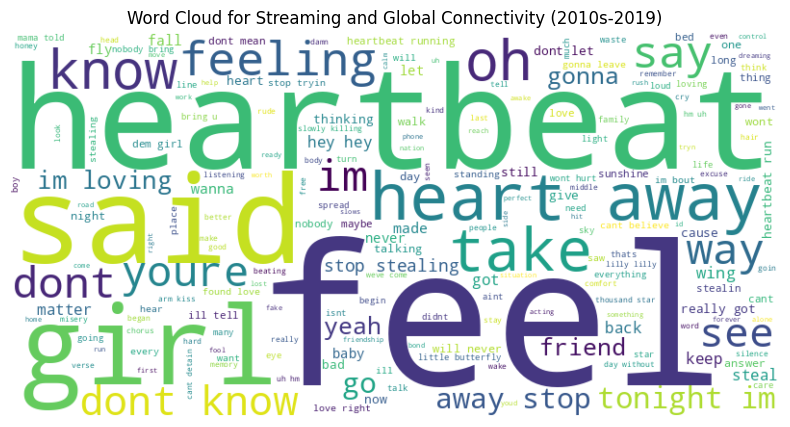

No data found for the Cross-Cultural Fusion (2020s-2029)


In [11]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud

def wordcloud_by_decade(df):
    # Define the decades and sub-decades as a list of tuples (start_year, end_year, label)
    decades = [
        (1950, 1959, "Birth of Rock 'n' Roll"),
        (1960, 1969, "Cultural Revolution"),
        (1970, 1979, "Rise of Diverse Genres"),
        (1980, 1989, "MTV Era and Electronic Explosion"),
        (1990, 1993, "The End of an Era"),
        (1994, 1996, "Expansion and Mainstream Success"),
        (1997, 1999, "Technological Advancements and Pop Culture Explosion"),
        (2000, 2009, "Digital Revolution"),
        (2010, 2019, "Streaming and Global Connectivity"),
        (2020, 2029, "Cross-Cultural Fusion")
    ]

    for start_year, end_year, label in decades:
        # Filter the DataFrame for the current period
        decade_df = df[(df['Release Year'] >= start_year) & (df['Release Year'] <= end_year)]

        if not decade_df.empty:
            # Combine all text entries into a single string
            text = " ".join(decade_df['clean_text'].astype(str))

            # Generate the word cloud
            wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)

            # Plot the word cloud
            plt.figure(figsize=(10, 5))
            plt.imshow(wordcloud, interpolation='bilinear')
            plt.axis("off")
            plt.title(f"Word Cloud for {label} ({start_year}s{'-' + str(end_year) if start_year != end_year else ''})")
            plt.show()
        else:
            print(f"No data found for the {label} ({start_year}s{'-' + str(end_year) if start_year != end_year else ''})")

# Example usage:
wordcloud_by_decade(df1)


In [12]:
!pip install matplotlib wordcloud


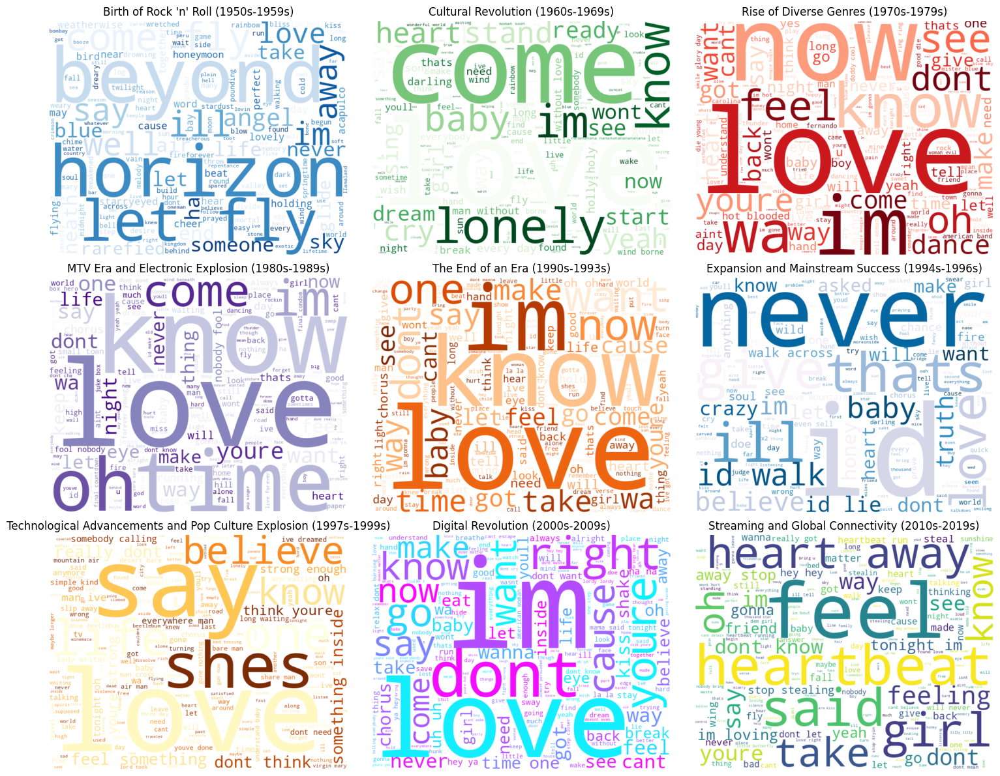

In [13]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import math

def combined_wordcloud_by_decade(df):
    # Define the decades and sub-decades as a list of tuples (start_year, end_year, label)
    decades = [
        (1950, 1959, "Birth of Rock 'n' Roll"),
        (1960, 1969, "Cultural Revolution"),
        (1970, 1979, "Rise of Diverse Genres"),
        (1980, 1989, "MTV Era and Electronic Explosion"),
        (1990, 1993, "The End of an Era"),
        (1994, 1996, "Expansion and Mainstream Success"),
        (1997, 1999, "Technological Advancements and Pop Culture Explosion"),
        (2000, 2009, "Digital Revolution"),
        (2010, 2019, "Streaming and Global Connectivity"),
        #(2020, 2029, "Cross-Cultural Fusion")  # Include if data for 2020s is available
    ]

    # Define a list of colormaps to assign to each period
    colormaps = [
        'Blues',
        'Greens',
        'Reds',
        'Purples',
        'Oranges',
        'PuBu',
        'YlOrBr',
        'cool',
        'viridis',
        'magma'
    ]

    # Ensure there are enough colormaps for all periods
    if len(colormaps) < len(decades):
        # Repeat the colormaps if not enough
        colormaps = colormaps * (math.ceil(len(decades) / len(colormaps)))

    num_periods = len(decades)
    cols = 3  # Number of columns in the subplot grid
    rows = math.ceil(num_periods / cols)  # Calculate the number of rows needed

    # Adjust the figure size as needed
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 4))  # Adjust height as needed
    axes = axes.flatten()  # Flatten in case of multiple rows

    for idx, (start_year, end_year, label) in enumerate(decades):
        ax = axes[idx]
        # Filter the DataFrame for the current period
        decade_df = df[(df['Release Year'] >= start_year) & (df['Release Year'] <= end_year)]

        if not decade_df.empty:
            # Combine all text entries into a single string
            text = " ".join(decade_df['clean_text'].astype(str))

            # Generate the word cloud
            wordcloud = WordCloud(
                width=700,
                height=550,
                background_color='white',
                colormap=colormaps[idx],  # Assign a unique colormap
                max_words=200
            ).generate(text)

            # Plot the word cloud
            ax.imshow(wordcloud, interpolation='bilinear')
            if start_year == end_year:
                title = f"{label} ({start_year}s)"
            else:
                title = f"{label} ({start_year}s-{end_year}s)"
            ax.set_title(title, fontsize=12)
            ax.axis("off")
        else:
            # If no data, display a message
            if start_year == end_year:
                title = f"{label} ({start_year}s)"
            else:
                title = f"{label} ({start_year}s-{end_year}s)"
            ax.text(0.5, 0.5, f"No data for\n{label}", horizontalalignment='center',
                    verticalalignment='center', fontsize=10, wrap=True)
            ax.set_title(title, fontsize=12)
            ax.axis("off")

    # Hide any unused subplots
    for idx in range(num_periods, len(axes)):
        axes[idx].axis('off')

    # Adjust spacing between subplots
    plt.tight_layout()
    plt.savefig('combined_wordcloud.png')  # Save the figure as 'combined_wordcloud.png'
    plt.show()

# Formatted wordcloud collage
combined_wordcloud_by_decade(df1)

In [14]:
import pandas as pd
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.manifold import TSNE
from sklearn.metrics import silhouette_score
import plotly.express as px
import math  # Needed for color palette adjustment

# ------------------------------- Data Loading and Preprocessing -------------------------------

# Assume df1 is already loaded and contains the necessary columns
# Example: df1 = pd.read_csv('your_data.csv')

# Identify the dummy variable column names
genre_columns = [col for col in df1.columns if col.startswith('Genre_')]
tempo_columns = [col for col in df1.columns if col.startswith('tempo_')]
duration_columns = [col for col in df1.columns if col.startswith('duration_')]

# ------------------------------- Mapping 'Release Year' to Time Periods -------------------------------

def map_release_year(year):
    if 1950 <= year <= 1959:
        return "1950s: Birth of Rock 'n' Roll"
    elif 1960 <= year <= 1969:
        return "1960s: Cultural Revolution"
    elif 1970 <= year <= 1979:
        return "1970s: Rise of Diverse Genres"
    elif 1980 <= year <= 1989:
        return "1980s: MTV Era and Electronic Explosion"
    elif 1990 <= year <= 1993:
        return "1990-1993: The End of an Era"
    elif 1994 <= year <= 1996:
        return "1994-1996: Expansion and Mainstream Success"
    elif 1997 <= year <= 1999:
        return "1997-1999: Technological Advancements and Pop Culture Explosion"
    elif 2000 <= year <= 2009:
        return "2000s: Digital Revolution"
    elif 2010 <= year <= 2019:
        return "2010s: Streaming and Global Connectivity"
    elif 2020 <= year <= 2029:
        return "2020s: Cross-Cultural Fusion"
    else:
        return "Other"

# Apply the mapping function to create a new 'Time_Period' column
df1['Time_Period'] = df1['Release Year'].apply(map_release_year)

# ------------------------------- Encoding 'Time_Period' as Features -------------------------------

# One-Hot Encode the 'Time_Period' categorical variable
time_period_dummies = pd.get_dummies(df1['Time_Period'], prefix='Time_Period')

# ------------------------------- Define the Features Including 'Time_Period' Dummies -------------------------------

# Define the initial base features including 'Artist_Popularity'
base_features = [
    'Danceability', 'Energy', 'Acousticness',
    'Valence', 'Speechiness', 'Liveness',
    'Loudness', 'Age_of_Song',
    'Major_Label', 'Explicit',
    'energy_valence_interaction', 'dance_energy_interaction',
    'overall_mood', 'is_instrumental',  # Use 'is_instrumental' instead of 'Instrumentalness'
    'Genre_Other',  # Ensure 'Genre_Other' is included
    'Artist_Popularity',
]

# Add genre, tempo, and duration dummy columns, ensuring no duplicates
additional_features = [col for col in genre_columns + tempo_columns + duration_columns if col not in base_features]

# Combine base and additional features
features = base_features + additional_features

# ------------------------------- Verify that All Base Features Exist in the DataFrame -------------------------------

missing_features = [feat for feat in features if feat not in df1.columns]
if missing_features:
    print(f"Warning: The following features are missing in df1 and will be excluded: {missing_features}")
    # Remove missing features from the list
    features = [feat for feat in features if feat in df1.columns]

# ------------------------------- Extract Features and Target -------------------------------

# Extract the base features
X_base = df1[features].copy()

# Concatenate the one-hot encoded 'Time_Period' features
X = pd.concat([X_base, time_period_dummies], axis=1)

# Define the target variable
y = df1['Popularity']  # Ensure 'Popularity' exists in df1

# ------------------------------- Handle Missing Values -------------------------------

if X.isnull().sum().any():
    print("Warning: Missing values detected in features. Filling missing values with 0.")
    X = X.fillna(0)

# ------------------------------- Feature Scaling -------------------------------

scaler = StandardScaler()
features_scaled = scaler.fit_transform(X)

# Convert scaled features back to a DataFrame, using the correct columns
X_scaled_df = pd.DataFrame(features_scaled, columns=X.columns)

# ------------------------------- Dimensionality Reduction using t-SNE -------------------------------

# Apply t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30, learning_rate=200, n_iter=1000)
X_tsne_transformed = tsne.fit_transform(X_scaled_df)

# Add t-SNE results to the original DataFrame for plotting
df1['tSNE-1'] = X_tsne_transformed[:, 0]
df1['tSNE-2'] = X_tsne_transformed[:, 1]

# ------------------------------- Compute Silhouette Score Using Time_Period Labels -------------------------------

# Encode 'Time_Period' labels as integers
label_encoder = LabelEncoder()
time_period_labels = label_encoder.fit_transform(df1['Time_Period'])

# Compute the Silhouette Score
sil_score = silhouette_score(X_scaled_df, time_period_labels)

print(f"Silhouette Score based on Time_Period labels: {sil_score:.4f}")

# ------------------------------- Define a Custom Color Palette -------------------------------

# Determine the number of unique Time Periods
unique_periods = df1['Time_Period'].unique()
num_periods = len(unique_periods)

# Generate a color palette with enough distinct colors
# Using Plotly's qualitative palettes which can handle up to 20 distinct categories
# Here, we use 'Plotly' palette which has sufficient distinct colors
color_palette = px.colors.qualitative.Plotly

# If there are more periods than colors in the palette, repeat the palette
if num_periods > len(color_palette):
    color_palette = color_palette * (math.ceil(num_periods / len(color_palette)))

# ------------------------------- Create an Interactive Scatter Plot using Plotly -------------------------------

fig = px.scatter(
    df1,
    x='tSNE-1',
    y='tSNE-2',
    color='Time_Period',  # Color by Time Period
    hover_data=['Primary Artist', 'Track Name', 'Album Name', 'Release Year'],  # Added 'Release Year'
    title=f't-SNE Visualization of Primary Artist Features with Time Periods\nSilhouette Score: {sil_score:.4f}',
    labels={
        'tSNE-1': 't-SNE Component 1',
        'tSNE-2': 't-SNE Component 2',
        'Time_Period': 'Time Period'
    },
    color_discrete_sequence=color_palette[:num_periods],  # Assign the color palette
    opacity=0.8,
    size_max=15
)

# Update layout for better aesthetics
fig.update_layout(
    width=1200,
    height=800,
    legend_title_text='Time Period'
)

# Show the interactive plot
fig.show()

# Optionally, save the interactive plot as an HTML file
fig.write_html("tSNE_visualization_with_Time_Period_and_Silhouette_Score.html")


Silhouette Score based on Time_Period labels: 0.2684


In [15]:
import pandas as pd
from sklearn.preprocessing import StandardScaler, LabelEncoder
import umap
import plotly.express as px
from sklearn.metrics import silhouette_score
import math

# ------------------------------- Data Loading and Preprocessing -------------------------------

# Identify the dummy variable column names
genre_columns = [col for col in df1.columns if col.startswith('Genre_')]
tempo_columns = [col for col in df1.columns if col.startswith('tempo_')]
duration_columns = [col for col in df1.columns if col.startswith('duration_')]

# ------------------------------- Mapping 'Release Year' to Time Periods -------------------------------

# Define the time periods based on 'Release Year', including sub-periods for the 1990s
def map_release_year(year):
    if 1950 <= year <= 1959:
        return "1950s: Birth of Rock 'n' Roll"
    elif 1960 <= year <= 1969:
        return "1960s: Cultural Revolution"
    elif 1970 <= year <= 1979:
        return "1970s: Rise of Diverse Genres"
    elif 1980 <= year <= 1989:
        return "1980s: MTV Era and Electronic Explosion"
    elif 1990 <= year <= 1993:
        return "1990-1993: The End of an Era"
    elif 1994 <= year <= 1996:
        return "1994-1996: Expansion and Mainstream Success"
    elif 1997 <= year <= 1999:
        return "1997-1999: Technological Advancements and Pop Culture Explosion"
    elif 2000 <= year <= 2009:
        return "2000s: Digital Revolution"
    elif 2010 <= year <= 2019:
        return "2010s: Streaming and Global Connectivity"
    elif 2020 <= year <= 2029:
        return "2020s: Cross-Cultural Fusion"
    else:
        return "Other"

# Apply the mapping function to create a new 'Time_Period' column
df1['Time_Period'] = df1['Release Year'].apply(map_release_year)

# ------------------------------- Encoding 'Time_Period' as Features -------------------------------

# One-Hot Encode the 'Time_Period' categorical variable
time_period_dummies = pd.get_dummies(df1['Time_Period'], prefix='Time_Period')

# ------------------------------- Define the Features Including 'Time_Period' Dummies -------------------------------

# Define the initial base features including 'Artist_Popularity'
base_features = [
    'Danceability', 'Energy', 'Acousticness',
    'Valence', 'Speechiness', 'Liveness',
    'Loudness', 'Age_of_Song',
    'Major_Label', 'Explicit',
    'energy_valence_interaction', 'dance_energy_interaction',
    'overall_mood', 'is_instrumental',  # Use 'is_instrumental' instead of 'Instrumentalness'
    'Genre_Other',  # Ensure 'Genre_Other' is included
    'Artist_Popularity',
]

# Add genre, tempo, and duration dummy columns, ensuring no duplicates
additional_features = [col for col in genre_columns + tempo_columns + duration_columns if col not in base_features]

# Combine base and additional features
features = base_features + additional_features

# ------------------------------- Verify that All Base Features Exist in the DataFrame -------------------------------

missing_features = [feat for feat in features if feat not in df1.columns]
if missing_features:
    print(f"Warning: The following features are missing in df1 and will be excluded: {missing_features}")
    # Remove missing features from the list
    features = [feat for feat in features if feat in df1.columns]

# ------------------------------- Extract Features and Target -------------------------------

# Extract the base features
X_base = df1[features].copy()

# Concatenate the one-hot encoded 'Time_Period' features
X = pd.concat([X_base, time_period_dummies], axis=1)

# Define the target variable
y = df1['Popularity']  # Ensure 'Popularity' exists in df1

# ------------------------------- Handle Missing Values -------------------------------

if X.isnull().sum().any():
    print("Warning: Missing values detected in features. Filling missing values with 0.")
    X = X.fillna(0)

# ------------------------------- Feature Scaling -------------------------------

scaler = StandardScaler()
features_scaled = scaler.fit_transform(X)

# Convert scaled features back to a DataFrame, using the correct columns
X_scaled_df = pd.DataFrame(features_scaled, columns=X.columns)

# ------------------------------- Dimensionality Reduction using UMAP -------------------------------

# Apply UMAP
reducer = umap.UMAP(n_components=2, random_state=42, n_neighbors=15, min_dist=0.1, metric='euclidean')
X_umap_transformed = reducer.fit_transform(X_scaled_df)

# Add UMAP results to the original DataFrame for plotting
df1['UMAP-1'] = X_umap_transformed[:, 0]
df1['UMAP-2'] = X_umap_transformed[:, 1]

# ------------------------------- Compute Silhouette Score Using Time_Period Labels -------------------------------

# Encode 'Time_Period' labels as integers
label_encoder = LabelEncoder()
time_period_labels = label_encoder.fit_transform(df1['Time_Period'])

# Compute the Silhouette Score
sil_score = silhouette_score(X_scaled_df, time_period_labels)

print(f"Silhouette Score based on Time_Period labels: {sil_score:.4f}")

# ------------------------------- Define a Custom Color Palette -------------------------------

# Determine the unique Time Periods
unique_periods = df1['Time_Period'].unique()
num_periods = len(unique_periods)

# Generate a color palette with enough distinct colors
# Using Plotly's qualitative palettes which can handle up to 20 distinct categories
# Here, we use 'Plotly' palette which has sufficient distinct colors
color_palette = px.colors.qualitative.Plotly

# If there are more periods than colors in the palette, repeat the palette
if num_periods > len(color_palette):
    color_palette = color_palette * (math.ceil(num_periods / len(color_palette)))

# ------------------------------- Create an Interactive Scatter Plot using Plotly -------------------------------

fig = px.scatter(
    df1,
    x='UMAP-1',
    y='UMAP-2',
    color='Time_Period',  # Color by Time Period
    hover_data=['Primary Artist', 'Track Name', 'Album Name', 'Release Year'],  # Added 'Release Year'
    title=f'UMAP Visualization of Primary Artist Features with Time Periods\nSilhouette Score: {sil_score:.4f}',
    labels={
        'UMAP-1': 'UMAP Component 1',
        'UMAP-2': 'UMAP Component 2',
        'Time_Period': 'Time Period'
    },
    color_discrete_sequence=color_palette[:num_periods],  # Assign the color palette
    opacity=0.8,
    size_max=15
)

# Update layout for better aesthetics
fig.update_layout(
    width=1200,
    height=800,
    legend_title_text='Time Period'
)

# Show the interactive plot
fig.show()

# Optionally, save the interactive plot as an HTML file
fig.write_html("UMAP_visualization_with_Time_Period_and_Silhouette_Score.html")

Silhouette Score based on Time_Period labels: 0.2684


Silhouette Score for KMeans + UMAP: 0.4345
Silhouette Score for Agglomerative + UMAP: 0.3706
Silhouette Score for DBSCAN + UMAP: 0.1680
Silhouette Score for HDBSCAN + UMAP: 0.8005


Plot saved as KMeans_Clustering_on_UMAP_time_feature.html


Plot saved as Agglomerative_Clustering_on_UMAP_time_feature.html


Plot saved as DBSCAN_Clustering_on_UMAP_time_feature.html


Plot saved as HDBSCAN_Clustering_on_UMAP_time_feature.html


Plot saved as UMAP_Projection_of_Time_Period_Feature.html
Number of samples in df1: 1634
Cluster Columns in df1:
['KMeans_UMAP_cluster', 'Agglomerative_UMAP_cluster', 'DBSCAN_UMAP_cluster', 'HDBSCAN_UMAP_cluster', 'cluster_plot']

Sample Cluster Assignments:
                        Track Name                    Primary Artist  \
0                           Sherry  Frankie Valli & The Four Seasons   
1                          Fix You                          Coldplay   
2  There You'll Be - 2007 Remaster                        Faith Hill   
3                    Paradise City                     Guns N' Roses   
4               The Edge of Heaven                             Wham!   

   KMeans_UMAP_cluster  Agglomerative_UMAP_cluster  DBSCAN_UMAP_cluster  \
0                    6                           4                    0   
1                    6                           1                    0   
2                    3                           7                    1   
3       

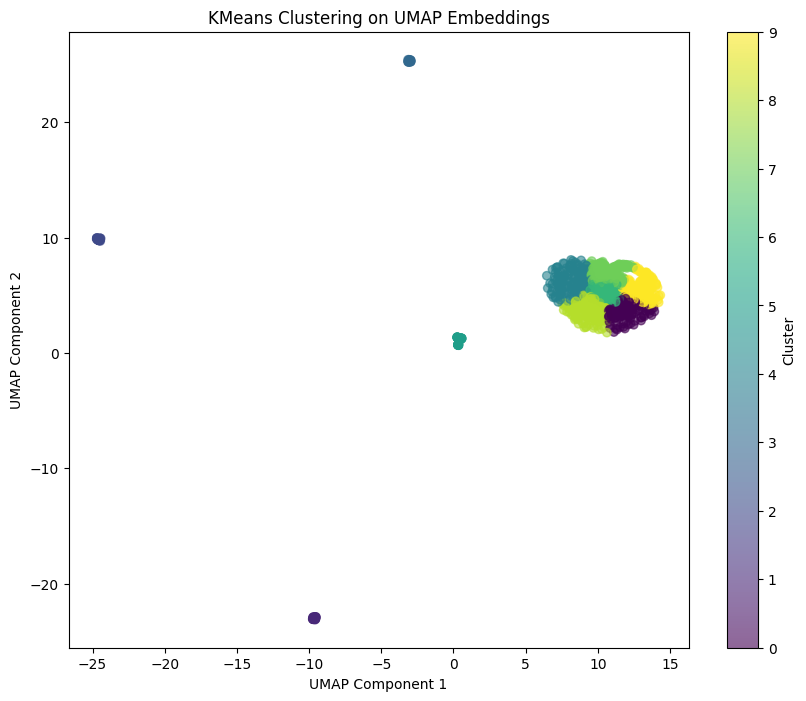

Matplotlib plot saved as KMeans_UMAP_Matplotlib.png


In [16]:
import pandas as pd
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.metrics import silhouette_score
import hdbscan
import umap
import plotly.express as px
import math
import matplotlib.pyplot as plt
import numpy as np

# ------------------------------- Data Loading and Preprocessing -------------------------------

# Assume df1 is already loaded and contains the necessary columns
# Example:
# df1 = pd.read_csv('your_data.csv')

# ------------------------------- Mapping 'Release Year' to Time Periods -------------------------------

def map_release_year(year):
    if 1950 <= year <= 1959:
        return "1950s: Birth of Rock 'n' Roll"
    elif 1960 <= year <= 1969:
        return "1960s: Cultural Revolution"
    elif 1970 <= year <= 1979:
        return "1970s: Rise of Diverse Genres"
    elif 1980 <= year <= 1989:
        return "1980s: MTV Era and Electronic Explosion"
    elif 1990 <= year <= 1993:
        return "1990-1993: The End of an Era"
    elif 1994 <= year <= 1996:
        return "1994-1996: Expansion and Mainstream Success"
    elif 1997 <= year <= 1999:
        return "1997-1999: Technological Advancements and Pop Culture Explosion"
    elif 2000 <= year <= 2009:
        return "2000s: Digital Revolution"
    elif 2010 <= year <= 2019:
        return "2010s: Streaming and Global Connectivity"
    elif 2020 <= year <= 2029:
        return "2020s: Cross-Cultural Fusion"
    else:
        return "Other"

# Apply the mapping function to create a new 'Time_Period' column
df1['Time_Period'] = df1['Release Year'].apply(map_release_year)

# ------------------------------- Encoding 'Time_Period' as Features -------------------------------

# One-Hot Encode the 'Time_Period' categorical variable
encoder = OneHotEncoder(sparse_output=False, drop='first')  # drop='first' to avoid multicollinearity
time_period_encoded = encoder.fit_transform(df1[['Time_Period']])
encoded_feature_names = encoder.get_feature_names_out(['Time_Period'])
time_period_df = pd.DataFrame(time_period_encoded,
                              columns=encoded_feature_names,
                              index=df1.index)

# ------------------------------- Define the Features Including 'Time_Period' Dummies -------------------------------

# Since we only want to use 'Time_Period' as the feature, we exclude all other features
features = encoded_feature_names.tolist()

# ------------------------------- Extract Features and Target -------------------------------

# Extract the 'Time_Period' features
X = time_period_df.copy()

# Define the target variable (if needed)
y = df1['Popularity']  # Ensure 'Popularity' exists in df1

# ------------------------------- Handle Missing Values -------------------------------

if X.isnull().sum().any():
    print("Warning: Missing values detected in features. Filling missing values with 0.")
    X = X.fillna(0)

# ------------------------------- Feature Scaling -------------------------------

scaler = StandardScaler()
features_scaled = scaler.fit_transform(X)

# Convert scaled features back to a DataFrame, using the correct columns
X_scaled_df = pd.DataFrame(features_scaled, columns=X.columns, index=X.index)

# ------------------------------- Dimensionality Reduction using UMAP -------------------------------

# Initialize UMAP
reducer = umap.UMAP(n_components=2, random_state=42, n_neighbors=15, min_dist=0.1, metric='euclidean')

# Fit and transform the scaled features
X_umap_transformed = reducer.fit_transform(X_scaled_df)

# Add UMAP results to the original DataFrame for plotting
df1['UMAP-1'] = X_umap_transformed[:, 0]
df1['UMAP-2'] = X_umap_transformed[:, 1]

# ------------------------------- Clustering -------------------------------

def perform_clustering(embeddings, data_frame, method='KMeans', n_clusters=5, eps=0.5, min_samples=5, embedding_type='UMAP'):
    """
    Performs clustering and adds cluster labels to the DataFrame.
    Also calculates and returns the Silhouette Score.

    Parameters:
    - embeddings (np.ndarray): The embeddings to cluster.
    - data_frame (pd.DataFrame): The DataFrame to which cluster labels will be added.
    - method (str): Clustering algorithm ('KMeans', 'Agglomerative', 'DBSCAN', 'HDBSCAN').
    - n_clusters (int): Number of clusters for algorithms that require it.
    - eps (float): The maximum distance between two samples for them to be considered as in the same neighborhood (DBSCAN).
    - min_samples (int): The number of samples in a neighborhood for a point to be considered as a core point (DBSCAN).
    - embedding_type (str): Type of embedding (e.g., 'UMAP').

    Returns:
    - sil_score (float or None): The Silhouette Score if computed, else None.
    """
    sil_score = None
    try:
        if method == 'KMeans':
            clustering = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
            clustering.fit(embeddings)
            labels = clustering.labels_
            cluster_col = f'KMeans_{embedding_type}_cluster'
            data_frame[cluster_col] = labels
            sil_score = silhouette_score(embeddings, labels)
            print(f"Silhouette Score for KMeans + {embedding_type}: {sil_score:.4f}")

        elif method == 'Agglomerative':
            clustering = AgglomerativeClustering(n_clusters=n_clusters)
            clustering.fit(embeddings)
            labels = clustering.labels_
            cluster_col = f'Agglomerative_{embedding_type}_cluster'
            data_frame[cluster_col] = labels
            sil_score = silhouette_score(embeddings, labels)
            print(f"Silhouette Score for Agglomerative + {embedding_type}: {sil_score:.4f}")

        elif method == 'DBSCAN':
            clustering = DBSCAN(eps=eps, min_samples=min_samples, metric='euclidean')
            clustering.fit(embeddings)
            labels = clustering.labels_
            cluster_col = f'DBSCAN_{embedding_type}_cluster'
            data_frame[cluster_col] = labels
            if len(set(labels)) > 1 and len(set(labels)) != 1:
                # Exclude noise (-1) for silhouette score
                mask = labels != -1
                if mask.sum() > 1:
                    sil_score = silhouette_score(embeddings[mask], labels[mask])
                    print(f"Silhouette Score for DBSCAN + {embedding_type}: {sil_score:.4f}")
                else:
                    print("DBSCAN did not find enough clusters to compute Silhouette Score.")
            else:
                print("DBSCAN did not find enough clusters to compute Silhouette Score.")

        elif method == 'HDBSCAN':
            clustering = hdbscan.HDBSCAN(min_cluster_size=5, metric='euclidean')
            clustering.fit(embeddings)
            labels = clustering.labels_
            cluster_col = f'HDBSCAN_{embedding_type}_cluster'
            data_frame[cluster_col] = labels
            mask = labels != -1
            if len(set(labels[mask])) > 1:
                sil_score = silhouette_score(embeddings[mask], labels[mask])
                print(f"Silhouette Score for HDBSCAN + {embedding_type}: {sil_score:.4f}")
            else:
                print("HDBSCAN did not find enough clusters to compute Silhouette Score.")

        else:
            print(f"Clustering method '{method}' is not supported.")
            return sil_score

    except Exception as e:
        print(f"An error occurred during {method} clustering: {e}")

    return sil_score

# ------------------------------- Perform Clustering with Different Methods --------------------------------

# Adjust 'n_clusters' based on the number of unique Time_Period categories minus one (due to drop='first')
# Assuming you have 11 Time_Periods (including 'Other'), and one was dropped
# You can set n_clusters accordingly. For example, n_clusters=5
# Feel free to adjust based on your analysis needs

# Perform KMeans Clustering
sil_kmeans = perform_clustering(
    embeddings=X_umap_transformed,
    data_frame=df1,
    method='KMeans',
    n_clusters=10,  # Adjust based on your data
    embedding_type='UMAP'
)

# Perform Agglomerative Clustering
sil_agglomerative = perform_clustering(
    embeddings=X_umap_transformed,
    data_frame=df1,
    method='Agglomerative',
    n_clusters=10,  # Adjust based on your data
    embedding_type='UMAP'
)

# Perform DBSCAN Clustering
sil_dbscan = perform_clustering(
    embeddings=X_umap_transformed,
    data_frame=df1,
    method='DBSCAN',
    eps=0.3,  # Adjust based on data density
    min_samples=5,  # Adjust based on data density
    embedding_type='UMAP'
)

# Perform HDBSCAN Clustering
sil_hdbscan = perform_clustering(
    embeddings=X_umap_transformed,
    data_frame=df1,
    method='HDBSCAN',
    embedding_type='UMAP'
)

# ------------------------------- Visualization -------------------------------

def plot_clusters(data_frame, x, y, cluster_col, title, sil_score=None):
    """
    Plots clusters using Plotly and saves the figure as an HTML file.

    Parameters:
    - data_frame (pd.DataFrame): The DataFrame containing the data.
    - x (str): Column name for the x-axis.
    - y (str): Column name for the y-axis.
    - cluster_col (str): Column name for cluster labels.
    - title (str): Base title of the plot.
    - sil_score (float or None): The Silhouette Score to include in the title.

    Returns:
    - fig (plotly.graph_objs._figure.Figure): The Plotly figure object.
    """
    if cluster_col not in data_frame.columns:
        print(f"Error: Column '{cluster_col}' does not exist in the DataFrame.")
        return None

    # Handle noise points for DBSCAN and HDBSCAN by assigning a separate category
    if 'DBSCAN' in cluster_col or 'HDBSCAN' in cluster_col:
        data_frame['cluster_plot'] = data_frame[cluster_col].apply(
            lambda x: 'Noise' if x == -1 else f'Cluster {x}'
        )
    else:
        data_frame['cluster_plot'] = data_frame[cluster_col].astype(str)

    # Define a custom color palette to ensure enough colors for clusters
    unique_clusters = data_frame['cluster_plot'].unique()
    num_clusters = len(unique_clusters)

    # Use Plotly's qualitative palette which can handle up to 20 distinct categories
    color_palette = px.colors.qualitative.Plotly
    if num_clusters > len(color_palette):
        color_palette = color_palette * (math.ceil(num_clusters / len(color_palette)))

    # Append Silhouette Score to the title if provided
    if sil_score is not None:
        full_title = f"{title}\nSilhouette Score: {sil_score:.4f}"
    else:
        full_title = title

    fig = px.scatter(
        data_frame,
        x=x,
        y=y,
        color='cluster_plot',
        hover_data=['Primary Artist', 'Track Name', 'Album Name', 'Release Year'],
        title=full_title,
        labels={x: x, y: y},
        color_discrete_sequence=color_palette[:num_clusters],
        opacity=0.8,
        size_max=15
    )

    # Update layout for better visualization
    fig.update_layout(
        width=1200,
        height=800,
        legend_title_text='Cluster'
    )

    # Show the interactive plot
    fig.show()

    # Save the figure as an HTML file
    filename = f"{title.replace(' ', '_').replace(':', '').replace('/', '')}.html"
    fig.write_html(filename)
    print(f"Plot saved as {filename}")

    return fig

# Plot KMeans Clustering
if sil_kmeans is not None:
    plot_clusters(
        data_frame=df1,
        x='UMAP-1',
        y='UMAP-2',
        cluster_col='KMeans_UMAP_cluster',
        title='KMeans Clustering on UMAP time feature',
        sil_score=sil_kmeans
    )
else:
    plot_clusters(
        data_frame=df1,
        x='UMAP-1',
        y='UMAP-2',
        cluster_col='KMeans_UMAP_cluster',
        title='KMeans Clustering on UMAP time feature'
    )

# Plot Agglomerative Clustering
if sil_agglomerative is not None:
    plot_clusters(
        data_frame=df1,
        x='UMAP-1',
        y='UMAP-2',
        cluster_col='Agglomerative_UMAP_cluster',
        title='Agglomerative Clustering on UMAP time feature',
        sil_score=sil_agglomerative
    )
else:
    plot_clusters(
        data_frame=df1,
        x='UMAP-1',
        y='UMAP-2',
        cluster_col='Agglomerative_UMAP_cluster',
        title='Agglomerative Clustering on UMAP time feature'
    )

# Plot DBSCAN Clustering
if sil_dbscan is not None:
    plot_clusters(
        data_frame=df1,
        x='UMAP-1',
        y='UMAP-2',
        cluster_col='DBSCAN_UMAP_cluster',
        title='DBSCAN Clustering on UMAP time feature',
        sil_score=sil_dbscan
    )
else:
    plot_clusters(
        data_frame=df1,
        x='UMAP-1',
        y='UMAP-2',
        cluster_col='DBSCAN_UMAP_cluster',
        title='DBSCAN Clustering on UMAP time feature'
    )

# Plot HDBSCAN Clustering
if sil_hdbscan is not None:
    plot_clusters(
        data_frame=df1,
        x='UMAP-1',
        y='UMAP-2',
        cluster_col='HDBSCAN_UMAP_cluster',
        title='HDBSCAN Clustering on UMAP time feature',
        sil_score=sil_hdbscan
    )
else:
    plot_clusters(
        data_frame=df1,
        x='UMAP-1',
        y='UMAP-2',
        cluster_col='HDBSCAN_UMAP_cluster',
        title='HDBSCAN Clustering on UMAP time feature'
    )

# ------------------------------- Separate Plot Colored by Time_Period for Comparison -------------------------------

def plot_time_period(data_frame, x, y, title):
    """
    Plots UMAP embeddings colored by Time_Period for comparison.

    Parameters:
    - data_frame (pd.DataFrame): The DataFrame containing the data.
    - x (str): Column name for the x-axis.
    - y (str): Column name for the y-axis.
    - title (str): Title of the plot.

    Returns:
    - fig (plotly.graph_objs._figure.Figure): The Plotly figure object.
    """
    unique_periods = data_frame['Time_Period'].unique()
    num_periods = len(unique_periods)
    color_palette = px.colors.qualitative.Set1  # Distinct colors for Time_Period

    if num_periods > len(color_palette):
        color_palette = color_palette * (math.ceil(num_periods / len(color_palette)))

    fig = px.scatter(
        data_frame,
        x=x,
        y=y,
        color='Time_Period',  # Color by Time Period
        hover_data=['Primary Artist', 'Track Name', 'Album Name', 'Release Year'],
        title=title,
        labels={x: x, y: y},
        color_discrete_sequence=color_palette[:num_periods],
        opacity=0.6,
        size_max=15
    )

    # Update layout for better aesthetics
    fig.update_layout(
        width=1200,
        height=800,
        legend_title_text='Time Period'
    )

    # Show the interactive plot
    fig.show()

    # Save the figure as an HTML file
    filename = f"{title.replace(' ', '_').replace(':', '').replace('/', '')}.html"
    fig.write_html(filename)
    print(f"Plot saved as {filename}")

    return fig

# Plot Time_Period Colored UMAP
plot_time_period(
    data_frame=df1,
    x='UMAP-1',
    y='UMAP-2',
    title='UMAP Projection of Time_Period Feature'
)

# ------------------------------- Additional Diagnostic Steps -------------------------------

# **a. Check Number of Samples**
print(f"Number of samples in df1: {len(df1)}")

# **b. Verify Cluster Columns Exist**
print("Cluster Columns in df1:")
print([col for col in df1.columns if 'cluster' in col])

# **c. Inspect Cluster Assignments**
print("\nSample Cluster Assignments:")
cluster_columns = [col for col in df1.columns if 'cluster' in col]
print(df1[['Track Name', 'Primary Artist'] + cluster_columns].head())

# **d. Attempt Plotting with Matplotlib as a Fallback**
plt.figure(figsize=(10, 8))
scatter = plt.scatter(df1['UMAP-1'], df1['UMAP-2'], c=df1['KMeans_UMAP_cluster'], cmap='viridis', alpha=0.6)
plt.title('KMeans Clustering on UMAP Embeddings')
plt.xlabel('UMAP Component 1')
plt.ylabel('UMAP Component 2')
plt.colorbar(scatter, label='Cluster')
plt.savefig("KMeans_UMAP_Matplotlib.png")
plt.show()
print("Matplotlib plot saved as KMeans_UMAP_Matplotlib.png")


In [17]:
# ---------------------------- Setup and Installation ----------------------------

# Install required packages (uncomment if running in a new environment)
# %pip install --upgrade sentence-transformers umap-learn plotly scikit-learn hdbscan gensim nltk openpyxl xlsxwriter

# ---------------------------- Import Necessary Libraries ----------------------------

from sentence_transformers import SentenceTransformer
import umap
import plotly.express as px
import numpy as np
import torch
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from sklearn.decomposition import PCA
import plotly.io as pio
import re
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import nltk
import hdbscan
from gensim.models import Word2Vec
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
import pandas as pd

# ---------------------------- Download NLTK Resources ----------------------------

nltk.download('stopwords', quiet=True)
nltk.download('wordnet', quiet=True)
nltk.download('omw-1.4', quiet=True)

# ---------------------------- Generate SBERT Embeddings ----------------------------

# Set Plotly renderer for Google Colab
pio.renderers.default = 'colab'  # Optimized for Google Colab

# Load SBERT model with GPU support if available
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"Using device: {device}")
model = SentenceTransformer('all-mpnet-base-v2', device=device)

# Extract cleaned text data
text_data = df1['text'].astype(str).tolist()

# Generate embeddings
embeddings = model.encode(
    text_data,
    batch_size=32,
    show_progress_bar=True,
    convert_to_numpy=True
)
print(f"SBERT Embeddings Shape: {embeddings.shape}")

# ---------------------------- Dimensionality Reduction ----------------------------

# Apply PCA to reduce dimensionality before UMAP
pca = PCA(n_components=300, random_state=42)
embeddings_pca = pca.fit_transform(embeddings)
print(f"PCA-reduced SBERT Embeddings Shape: {embeddings_pca.shape}")

# Apply UMAP for further dimensionality reduction
umap_model = umap.UMAP(n_components=2, random_state=42)
embeddings_umap = umap_model.fit_transform(embeddings_pca)
print(f"UMAP-reduced SBERT Embeddings Shape: {embeddings_umap.shape}")

# Add UMAP components to DataFrame
df1['umap_x'] = embeddings_umap[:, 0]
df1['umap_y'] = embeddings_umap[:, 1]

Using device: cuda


modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.6k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/571 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/438M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/363 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/239 [00:00<?, ?B/s]

1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

Batches:   0%|          | 0/52 [00:00<?, ?it/s]

SBERT Embeddings Shape: (1634, 768)
PCA-reduced SBERT Embeddings Shape: (1634, 300)
UMAP-reduced SBERT Embeddings Shape: (1634, 2)


Silhouette Score for KMeans + UMAP: 0.3571
Silhouette Score for Agglomerative + UMAP: 0.2927
Silhouette Score for DBSCAN + UMAP: -0.4493
Silhouette Score for HDBSCAN + UMAP: 0.4466


Plot saved as KMeans_Clustering_on_UMAP_sBert_Embeddings.html


Plot saved as Agglomerative_Clustering_on_UMAP_sBert_Embeddings.html


Plot saved as DBSCAN_Clustering_on_UMAP_sBert_Embeddings.html


Plot saved as HDBSCAN_Clustering_on_UMAP_sBert_Embeddings.html
Number of samples in df1: 1634
Cluster Columns in df1:
['KMeans_UMAP_cluster', 'Agglomerative_UMAP_cluster', 'DBSCAN_UMAP_cluster', 'HDBSCAN_UMAP_cluster', 'cluster_plot']

Sample Cluster Assignments:
                        Track Name                    Primary Artist  \
0                           Sherry  Frankie Valli & The Four Seasons   
1                          Fix You                          Coldplay   
2  There You'll Be - 2007 Remaster                        Faith Hill   
3                    Paradise City                     Guns N' Roses   
4               The Edge of Heaven                             Wham!   

   KMeans_UMAP_cluster  Agglomerative_UMAP_cluster  DBSCAN_UMAP_cluster  \
0                    4                           3                    0   
1                    6                           6                    0   
2                    8                           0                    0   
3  

Sanity check plot saved as UMAP_sanity_check_Time_Period.html


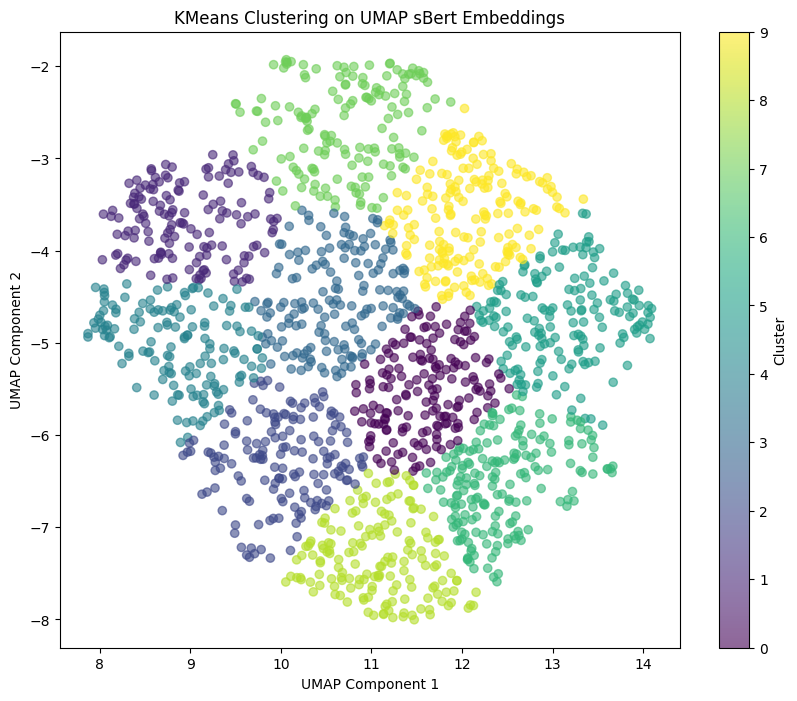

Matplotlib plot saved as KMeans_UMAP_Matplotlib.png


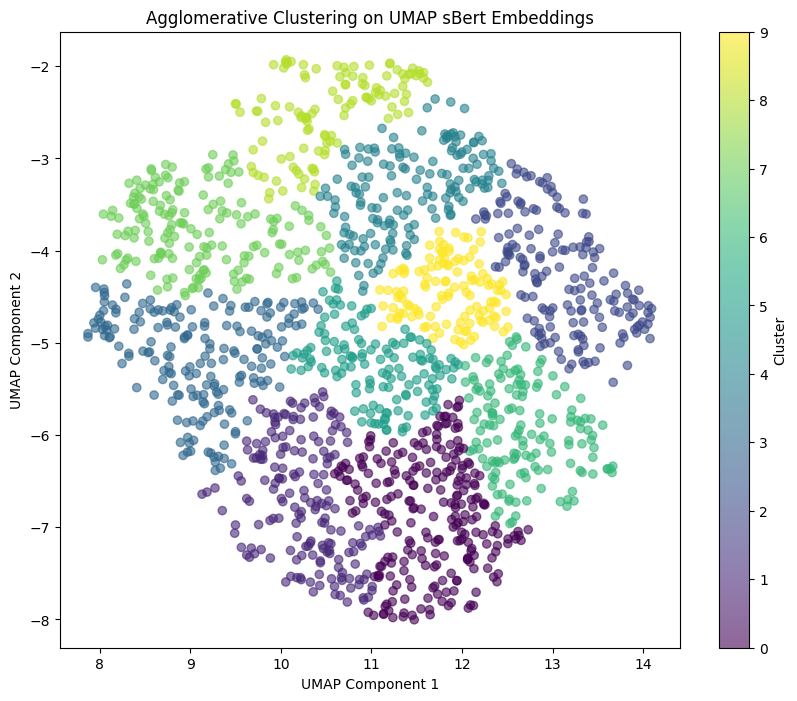

Matplotlib plot saved as Agglomerative_UMAP_Matplotlib.png


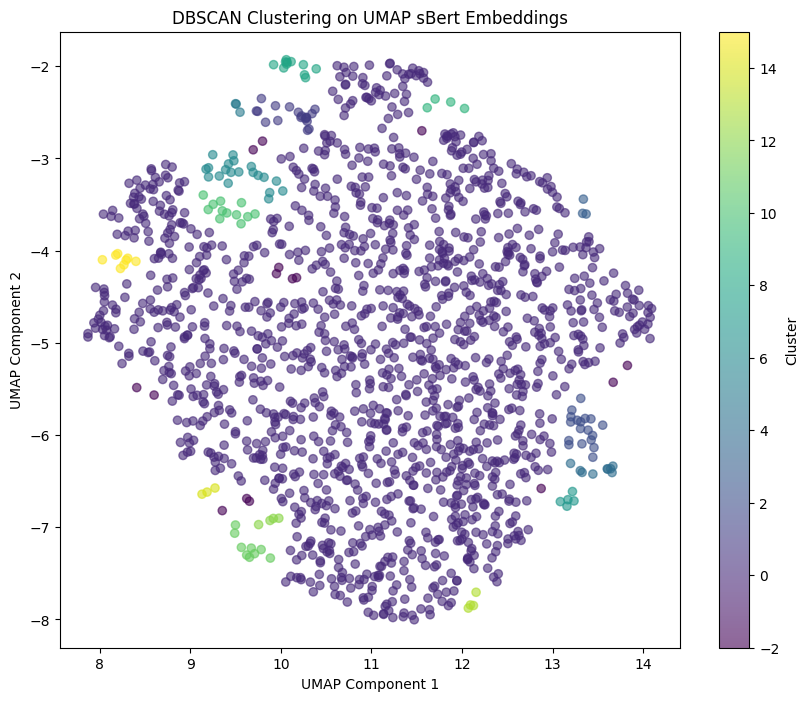

Matplotlib plot saved as DBSCAN_UMAP_Matplotlib.png


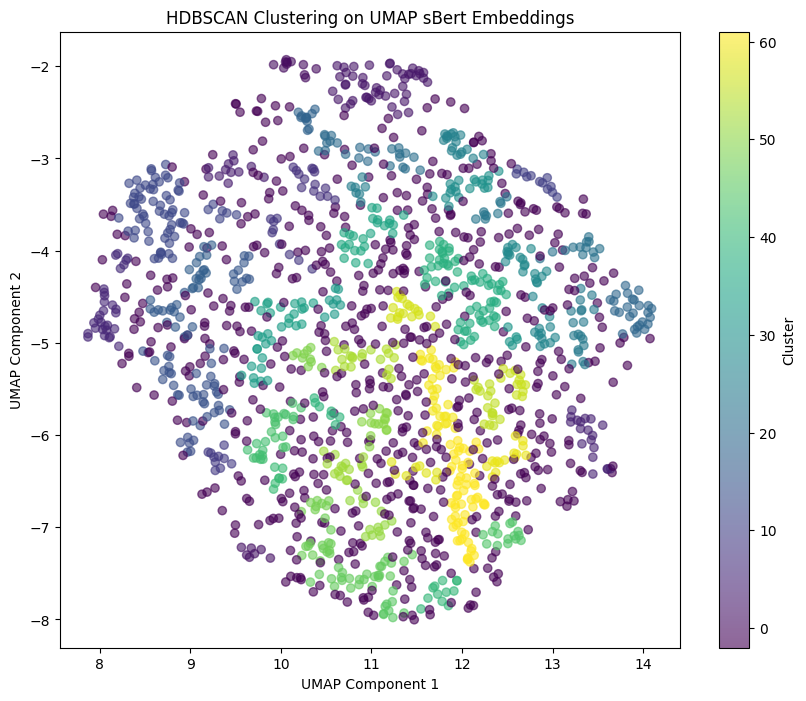

Matplotlib plot saved as HDBSCAN_UMAP_Matplotlib.png


In [18]:
# import pandas as pd
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.metrics import silhouette_score
import hdbscan
import umap
import plotly.express as px
import math
import matplotlib.pyplot as plt
import numpy as np

# ------------------------------- Data Loading and Preprocessing -------------------------------

# Assume df1 is already loaded and contains the necessary columns
# Example: df1 = pd.read_csv('your_data.csv')

# Convert SBERT embeddings into a DataFrame
# Assume 'embeddings' is a precomputed variable containing SBERT embeddings
# For example: embeddings = np.random.rand(len(df1), 768)  # Example SBERT embeddings
# Ensure that 'embeddings' has the same number of rows as df1

# ------------------------------- Mapping 'Release Year' to Detailed Time Periods -------------------------------

def map_release_year(year):
    if 1950 <= year <= 1959:
        return "1950s: Birth of Rock 'n' Roll"
    elif 1960 <= year <= 1969:
        return "1960s: Cultural Revolution"
    elif 1970 <= year <= 1979:
        return "1970s: Rise of Diverse Genres"
    elif 1980 <= year <= 1989:
        return "1980s: MTV Era and Electronic Explosion"
    elif 1990 <= year <= 1993:
        return "1990-1993: The End of an Era"
    elif 1994 <= year <= 1996:
        return "1994-1996: Expansion and Mainstream Success"
    elif 1997 <= year <= 1999:
        return "1997-1999: Technological Advancements and Pop Culture Explosion"
    elif 2000 <= year <= 2009:
        return "2000s: Digital Revolution"
    elif 2010 <= year <= 2019:
        return "2010s: Streaming and Global Connectivity"
    elif 2020 <= year <= 2029:
        return "2020s: Cross-Cultural Fusion"
    else:
        return "Other"

# Apply the mapping function to create a new 'Time_Period' column
df1['Time_Period'] = df1['Release Year'].apply(map_release_year)

# ------------------------------- Incorporate SBERT Embeddings -------------------------------

# Check if 'embeddings' is defined
if 'embeddings' not in locals():
    raise ValueError("The variable 'embeddings' containing SBERT embeddings is not defined.")

sbert_embeddings = pd.DataFrame(embeddings, index=df1.index).add_prefix('SBERT_')

# ------------------------------- Encode 'Time_Period' -------------------------------

# Initialize OneHotEncoder
encoder = OneHotEncoder(sparse_output=False, drop='first')  # drop='first' to avoid multicollinearity

# Fit and transform 'Time_Period'
time_period_encoded = encoder.fit_transform(df1[['Time_Period']])

# Get encoded feature names
encoded_feature_names = encoder.get_feature_names_out(['Time_Period'])

# Convert to DataFrame
time_period_df = pd.DataFrame(time_period_encoded,
                              columns=encoded_feature_names,
                              index=df1.index)

# ------------------------------- Combine SBERT Embeddings and Time_Period Features -------------------------------

# Concatenate SBERT embeddings and encoded Time_Period
combined_features = pd.concat([sbert_embeddings, time_period_df], axis=1)

# ------------------------------- Feature Scaling -------------------------------

# Initialize StandardScaler
scaler = StandardScaler()

# Fit and transform combined features
features_scaled = scaler.fit_transform(combined_features)

# Convert scaled features back to a DataFrame
combined_scaled_df = pd.DataFrame(features_scaled,
                                  columns=combined_features.columns,
                                  index=combined_features.index)

# ------------------------------- Dimensionality Reduction with UMAP -------------------------------

# Initialize UMAP
reducer = umap.UMAP(n_components=2,
                    random_state=42,
                    n_neighbors=15,
                    min_dist=0.1,
                    metric='euclidean')

# Fit and transform the scaled features
X_umap_transformed = reducer.fit_transform(combined_scaled_df)

# Add UMAP results to the original DataFrame for plotting
df1['UMAP-1'] = X_umap_transformed[:, 0]
df1['UMAP-2'] = X_umap_transformed[:, 1]

# ------------------------------- Clustering -------------------------------

def perform_clustering(embeddings, data_frame, method='KMeans', n_clusters=10, eps=0.2, min_samples=5, embedding_type='UMAP'):
    """
    Performs clustering and adds cluster labels to the DataFrame.
    Also calculates and returns the Silhouette Score.

    Parameters:
    - embeddings (np.ndarray): The embeddings to cluster.
    - data_frame (pd.DataFrame): The DataFrame to which cluster labels will be added.
    - method (str): Clustering algorithm ('KMeans', 'Agglomerative', 'DBSCAN', 'HDBSCAN').
    - n_clusters (int): Number of clusters for algorithms that require it.
    - eps (float): The maximum distance between two samples for them to be considered as in the same neighborhood (DBSCAN).
    - min_samples (int): The number of samples in a neighborhood for a point to be considered as a core point (DBSCAN).
    - embedding_type (str): Type of embedding (e.g., 'UMAP').

    Returns:
    - sil_score (float or None): The Silhouette Score if computed, else None.
    """
    sil_score = None
    try:
        if method == 'KMeans':
            clustering = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
            clustering.fit(embeddings)
            labels = clustering.labels_
            cluster_col = f'KMeans_{embedding_type}_cluster'
            data_frame[cluster_col] = labels
            sil_score = silhouette_score(embeddings, labels)
            print(f"Silhouette Score for KMeans + {embedding_type}: {sil_score:.4f}")

        elif method == 'Agglomerative':
            clustering = AgglomerativeClustering(n_clusters=n_clusters)
            clustering.fit(embeddings)
            labels = clustering.labels_
            cluster_col = f'Agglomerative_{embedding_type}_cluster'
            data_frame[cluster_col] = labels
            sil_score = silhouette_score(embeddings, labels)
            print(f"Silhouette Score for Agglomerative + {embedding_type}: {sil_score:.4f}")

        elif method == 'DBSCAN':
            clustering = DBSCAN(eps=eps, min_samples=min_samples, metric='euclidean')
            clustering.fit(embeddings)
            labels = clustering.labels_
            cluster_col = f'DBSCAN_{embedding_type}_cluster'
            data_frame[cluster_col] = labels
            if len(set(labels)) > 1 and len(set(labels)) != 1:
                # Exclude noise (-1) for silhouette score
                mask = labels != -1
                if mask.sum() > 1:
                    sil_score = silhouette_score(embeddings[mask], labels[mask])
                    print(f"Silhouette Score for DBSCAN + {embedding_type}: {sil_score:.4f}")
                else:
                    print("DBSCAN did not find enough clusters to compute Silhouette Score.")
            else:
                print("DBSCAN did not find enough clusters to compute Silhouette Score.")

        elif method == 'HDBSCAN':
            clustering = hdbscan.HDBSCAN(min_cluster_size=5, metric='euclidean')
            clustering.fit(embeddings)
            labels = clustering.labels_
            cluster_col = f'HDBSCAN_{embedding_type}_cluster'
            data_frame[cluster_col] = labels
            mask = labels != -1
            if len(set(labels[mask])) > 1:
                sil_score = silhouette_score(embeddings[mask], labels[mask])
                print(f"Silhouette Score for HDBSCAN + {embedding_type}: {sil_score:.4f}")
            else:
                print("HDBSCAN did not find enough clusters to compute Silhouette Score.")

        else:
            print(f"Clustering method '{method}' is not supported.")
            return sil_score

    except Exception as e:
        print(f"An error occurred during {method} clustering: {e}")

    return sil_score

# Perform KMeans Clustering
sil_kmeans = perform_clustering(
    embeddings=X_umap_transformed,
    data_frame=df1,
    method='KMeans',
    n_clusters=10,  # Adjust based on the number of time periods (10 in this case)
    embedding_type='UMAP'
)

# Perform Agglomerative Clustering
sil_agglomerative = perform_clustering(
    embeddings=X_umap_transformed,
    data_frame=df1,
    method='Agglomerative',
    n_clusters=10,  # Adjust based on the number of time periods
    embedding_type='UMAP'
)

# Perform DBSCAN Clustering
sil_dbscan = perform_clustering(
    embeddings=X_umap_transformed,
    data_frame=df1,
    method='DBSCAN',
    eps=0.18,  # Adjust based on data density
    min_samples=3,  # Adjust based on data density
    embedding_type='UMAP'
)

# Perform HDBSCAN Clustering
sil_hdbscan = perform_clustering(
    embeddings=X_umap_transformed,
    data_frame=df1,
    method='HDBSCAN',
    embedding_type='UMAP'
)

# ------------------------------- Visualization -------------------------------

def plot_clusters(data_frame, x, y, cluster_col, title, sil_score=None):
    """
    Plots clusters using Plotly and saves the figure as an HTML file.

    Parameters:
    - data_frame (pd.DataFrame): The DataFrame containing the data.
    - x (str): Column name for the x-axis.
    - y (str): Column name for the y-axis.
    - cluster_col (str): Column name for cluster labels.
    - title (str): Base title of the plot.
    - sil_score (float or None): The Silhouette Score to include in the title.

    Returns:
    - fig (plotly.graph_objs._figure.Figure): The Plotly figure object.
    """
    if cluster_col not in data_frame.columns:
        print(f"Error: Column '{cluster_col}' does not exist in the DataFrame.")
        return None

    # Handle noise points for DBSCAN and HDBSCAN by assigning a separate category
    if 'DBSCAN' in cluster_col or 'HDBSCAN' in cluster_col:
        data_frame['cluster_plot'] = data_frame[cluster_col].apply(
            lambda x: 'Noise' if x == -1 else f'Cluster {x}'
        )
    else:
        data_frame['cluster_plot'] = data_frame[cluster_col].astype(str)

    # Define a custom color palette to ensure enough colors for clusters
    unique_clusters = data_frame['cluster_plot'].unique()
    num_clusters = len(unique_clusters)

    # Use Plotly's qualitative palette which can handle up to 20 distinct categories
    color_palette = px.colors.qualitative.Plotly
    if num_clusters > len(color_palette):
        color_palette = color_palette * (math.ceil(num_clusters / len(color_palette)))

    # Append Silhouette Score to the title if provided
    if sil_score is not None:
        full_title = f"{title}\nSilhouette Score: {sil_score:.4f}"
    else:
        full_title = title

    fig = px.scatter(
        data_frame,
        x=x,
        y=y,
        color='cluster_plot',
        hover_data=['Primary Artist', 'Track Name', 'Album Name', 'Release Year'],
        title=full_title,
        labels={x: x, y: y},
        color_discrete_sequence=color_palette[:num_clusters],
        opacity=0.8,
        size_max=15
    )

    # Update layout for better visualization
    fig.update_layout(
        width=1200,
        height=800,
        legend_title_text='Cluster'
    )

    # Show the interactive plot
    fig.show()

    # Save the figure as an HTML file
    filename = f"{title.replace(' ', '_').replace(':', '').replace('/', '')}.html"
    fig.write_html(filename)
    print(f"Plot saved as {filename}")

    return fig

# Plot KMeans Clustering
if sil_kmeans is not None:
    plot_clusters(
        data_frame=df1,
        x='UMAP-1',
        y='UMAP-2',
        cluster_col='KMeans_UMAP_cluster',
        title='KMeans Clustering on UMAP sBert Embeddings',
        sil_score=sil_kmeans
    )
else:
    plot_clusters(
        data_frame=df1,
        x='UMAP-1',
        y='UMAP-2',
        cluster_col='KMeans_UMAP_cluster',
        title='KMeans Clustering on UMAP sBert Embeddings'
    )

# Plot Agglomerative Clustering
if sil_agglomerative is not None:
    plot_clusters(
        data_frame=df1,
        x='UMAP-1',
        y='UMAP-2',
        cluster_col='Agglomerative_UMAP_cluster',
        title='Agglomerative Clustering on UMAP sBert Embeddings',
        sil_score=sil_agglomerative
    )
else:
    plot_clusters(
        data_frame=df1,
        x='UMAP-1',
        y='UMAP-2',
        cluster_col='Agglomerative_UMAP_cluster',
        title='Agglomerative Clustering on UMAP sBert Embeddings'
    )

# Plot DBSCAN Clustering
if sil_dbscan is not None:
    plot_clusters(
        data_frame=df1,
        x='UMAP-1',
        y='UMAP-2',
        cluster_col='DBSCAN_UMAP_cluster',
        title='DBSCAN Clustering on UMAP sBert Embeddings',
        sil_score=sil_dbscan
    )
else:
    plot_clusters(
        data_frame=df1,
        x='UMAP-1',
        y='UMAP-2',
        cluster_col='DBSCAN_UMAP_cluster',
        title='DBSCAN Clustering on UMAP sBert Embeddings'
    )

# Plot HDBSCAN Clustering
if sil_hdbscan is not None:
    plot_clusters(
        data_frame=df1,
        x='UMAP-1',
        y='UMAP-2',
        cluster_col='HDBSCAN_UMAP_cluster',
        title='HDBSCAN Clustering on UMAP sBert Embeddings',
        sil_score=sil_hdbscan
    )
else:
    plot_clusters(
        data_frame=df1,
        x='UMAP-1',
        y='UMAP-2',
        cluster_col='HDBSCAN_UMAP_cluster',
        title='HDBSCAN Clustering on UMAP sBert Embeddings'
    )

# ------------------------------- Additional Diagnostic Steps -------------------------------

# **a. Check Number of Samples**
print(f"Number of samples in df1: {len(df1)}")

# **b. Verify Cluster Columns Exist**
print("Cluster Columns in df1:")
print([col for col in df1.columns if 'cluster' in col])

# **c. Inspect Cluster Assignments**
print("\nSample Cluster Assignments:")
cluster_columns = [col for col in df1.columns if 'cluster' in col]
print(df1[['Track Name', 'Primary Artist'] + cluster_columns].head())

# **d. Plot UMAP Embeddings Colored by Time Period (Sanity Check)**
fig_sanity = px.scatter(
    df1,
    x='UMAP-1',
    y='UMAP-2',
    hover_data=['Primary Artist', 'Track Name'],
    title='UMAP Projection of Features Colored by Time Period',
    labels={'UMAP-1': 'UMAP Component 1', 'UMAP-2': 'UMAP Component 2'},
    color='Time_Period',  # Color by Time Period for comparison
    color_discrete_sequence=px.colors.qualitative.Set1,  # Use a distinct palette
    opacity=0.6,
    size_max=15
)
fig_sanity.update_layout(width=1200, height=800, legend_title_text='Time Period')
fig_sanity.show()

# Save the sanity check plot
fig_sanity.write_html("UMAP_sanity_check_Time_Period.html")
print("Sanity check plot saved as UMAP_sanity_check_Time_Period.html")

# **e. Attempt Plotting with Matplotlib as a Fallback**
# Plot KMeans Clustering with Matplotlib
plt.figure(figsize=(10, 8))
scatter = plt.scatter(df1['UMAP-1'], df1['UMAP-2'], c=df1['KMeans_UMAP_cluster'], cmap='viridis', alpha=0.6)
plt.title('KMeans Clustering on UMAP sBert Embeddings')
plt.xlabel('UMAP Component 1')
plt.ylabel('UMAP Component 2')
plt.colorbar(scatter, label='Cluster')
plt.savefig("KMeans_UMAP_Matplotlib.png")
plt.show()
print("Matplotlib plot saved as KMeans_UMAP_Matplotlib.png")

# Plot Agglomerative Clustering with Matplotlib
plt.figure(figsize=(10, 8))
scatter = plt.scatter(df1['UMAP-1'], df1['UMAP-2'], c=df1['Agglomerative_UMAP_cluster'], cmap='viridis', alpha=0.6)
plt.title('Agglomerative Clustering on UMAP sBert Embeddings')
plt.xlabel('UMAP Component 1')
plt.ylabel('UMAP Component 2')
plt.colorbar(scatter, label='Cluster')
plt.savefig("Agglomerative_UMAP_Matplotlib.png")
plt.show()
print("Matplotlib plot saved as Agglomerative_UMAP_Matplotlib.png")

# Plot DBSCAN Clustering with Matplotlib
plt.figure(figsize=(10, 8))
# Assign a unique color to noise if present, and convert to numeric type for colormap
colors_dbscan = df1['DBSCAN_UMAP_cluster'].apply(lambda x: -2 if x == -1 else x).astype(int) # Convert to numeric

scatter = plt.scatter(df1['UMAP-1'], df1['UMAP-2'], c=colors_dbscan, cmap='viridis', alpha=0.6)
plt.title('DBSCAN Clustering on UMAP sBert Embeddings')
plt.xlabel('UMAP Component 1')
plt.ylabel('UMAP Component 2')
plt.colorbar(scatter, label='Cluster')
plt.savefig("DBSCAN_UMAP_Matplotlib.png")
plt.show()
print("Matplotlib plot saved as DBSCAN_UMAP_Matplotlib.png")

# Plot HDBSCAN Clustering with Matplotlib
plt.figure(figsize=(10, 8))
# Assign a unique color to noise if present, and convert to numeric type for colormap
colors_hdbscan = df1['HDBSCAN_UMAP_cluster'].apply(lambda x: -2 if x == -1 else x).astype(int) # Convert to numeric
scatter = plt.scatter(df1['UMAP-1'], df1['UMAP-2'], c=colors_hdbscan, cmap='viridis', alpha=0.6)
plt.title('HDBSCAN Clustering on UMAP sBert Embeddings')
plt.xlabel('UMAP Component 1')
plt.ylabel('UMAP Component 2')
plt.colorbar(scatter, label='Cluster')
plt.savefig("HDBSCAN_UMAP_Matplotlib.png")
plt.show()
print("Matplotlib plot saved as HDBSCAN_UMAP_Matplotlib.png")


Silhouette Score for KMeans + UMAP: 0.6957
Silhouette Score for Agglomerative + UMAP: 0.6487
Silhouette Score for DBSCAN + UMAP: 0.5293
Silhouette Score for HDBSCAN + UMAP: 0.7456


Plot saved as KMeans_Clustering_on_UMAP_All_Features.html


Plot saved as Agglomerative_Clustering_on_All_Features.html


Plot saved as DBSCAN_Clustering_on_All_Features.html


Plot saved as HDBSCAN_Clustering_on_All_Featuress.html


Plot saved as UMAP_Projection_of_Features_Colored_by_Time_Period.html
Number of samples in df1: 1634
Cluster Columns in df1:
['KMeans_UMAP_cluster', 'Agglomerative_UMAP_cluster', 'DBSCAN_UMAP_cluster', 'HDBSCAN_UMAP_cluster', 'cluster_plot']

Sample Cluster Assignments:
                        Track Name                    Primary Artist  \
0                           Sherry  Frankie Valli & The Four Seasons   
1                          Fix You                          Coldplay   
2  There You'll Be - 2007 Remaster                        Faith Hill   
3                    Paradise City                     Guns N' Roses   
4               The Edge of Heaven                             Wham!   

   KMeans_UMAP_cluster  Agglomerative_UMAP_cluster  DBSCAN_UMAP_cluster  \
0                    4                           6                    0   
1                    9                           0                    1   
2                    7                           1                    2

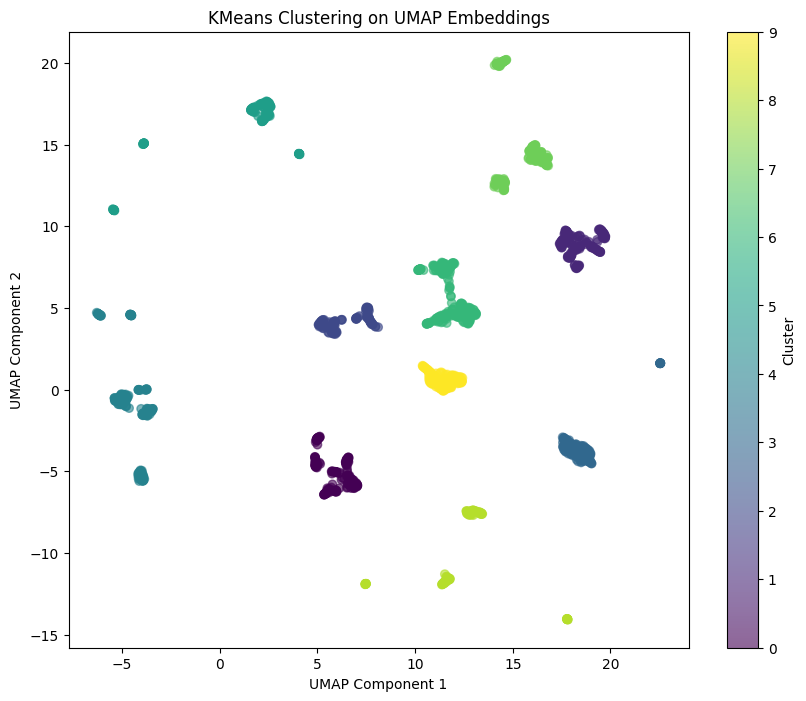

Matplotlib plot saved as KMeans_UMAP_Matplotlib.png


In [19]:
import pandas as pd
from sklearn.preprocessing import StandardScaler, LabelEncoder, OneHotEncoder
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.metrics import silhouette_score
import hdbscan
import umap
import plotly.express as px
import math
import matplotlib.pyplot as plt
import numpy as np

# ------------------------------- Data Loading and Preprocessing -------------------------------

# Assume df1 is already loaded and contains the necessary columns
# Example:
# df1 = pd.read_csv('your_data.csv')

# Check if 'embeddings' is defined
if 'embeddings' not in locals():
    raise ValueError("The variable 'embeddings' containing SBERT embeddings is not defined.")

# Convert SBERT embeddings into a DataFrame
sbert_embeddings = pd.DataFrame(embeddings, index=df1.index).add_prefix('SBERT_')

# ------------------------------- Mapping 'Release Year' to Detailed Time Periods -------------------------------

def map_release_year(year):
    if 1950 <= year <= 1959:
        return "1950s: Birth of Rock 'n' Roll"
    elif 1960 <= year <= 1969:
        return "1960s: Cultural Revolution"
    elif 1970 <= year <= 1979:
        return "1970s: Rise of Diverse Genres"
    elif 1980 <= year <= 1989:
        return "1980s: MTV Era and Electronic Explosion"
    elif 1990 <= year <= 1993:
        return "1990-1993: The End of an Era"
    elif 1994 <= year <= 1996:
        return "1994-1996: Expansion and Mainstream Success"
    elif 1997 <= year <= 1999:
        return "1997-1999: Technological Advancements and Pop Culture Explosion"
    elif 2000 <= year <= 2009:
        return "2000s: Digital Revolution"
    elif 2010 <= year <= 2019:
        return "2010s: Streaming and Global Connectivity"
    elif 2020 <= year <= 2029:
        return "2020s: Cross-Cultural Fusion"
    else:
        return "Other"

# Apply the mapping function to create a new 'Time_Period' column
df1['Time_Period'] = df1['Release Year'].apply(map_release_year)

# ------------------------------- Encode 'Time_Period' as Features -------------------------------

# One-Hot Encode the 'Time_Period' categorical variable
encoder = OneHotEncoder(sparse_output=False, drop='first')  # drop='first' to avoid multicollinearity
time_period_encoded = encoder.fit_transform(df1[['Time_Period']])
encoded_feature_names = encoder.get_feature_names_out(['Time_Period'])
time_period_df = pd.DataFrame(time_period_encoded,
                              columns=encoded_feature_names,
                              index=df1.index)

# ------------------------------- Define the Features Including 'Time_Period' Dummies -------------------------------

# Define the initial base features including 'Artist_Popularity'
base_features = [
    'Danceability', 'Energy', 'Acousticness',
    'Valence', 'Speechiness', 'Liveness',
    'Loudness', 'Age_of_Song',
    'Major_Label', 'Explicit',
    'energy_valence_interaction', 'dance_energy_interaction',
    'overall_mood', 'is_instrumental',  # Use 'is_instrumental' instead of 'Instrumentalness'
    'Genre_Other',  # Ensure 'Genre_Other' is included
    'Artist_Popularity',
]

# Add genre, tempo, and duration dummy columns, ensuring no duplicates
genre_columns = [col for col in df1.columns if col.startswith('Genre_')]
tempo_columns = [col for col in df1.columns if col.startswith('tempo_')]
duration_columns = [col for col in df1.columns if col.startswith('duration_')]
additional_features = [col for col in genre_columns + tempo_columns + duration_columns if col not in base_features]

# Combine base and additional features
features = base_features + additional_features

# ------------------------------- Verify that All Base Features Exist in the DataFrame -------------------------------

missing_features = [feat for feat in features if feat not in df1.columns]
if missing_features:
    print(f"Warning: The following features are missing in df1 and will be excluded: {missing_features}")
    # Remove missing features from the list
    features = [feat for feat in features if feat in df1.columns]

# ------------------------------- Extract Features and Target -------------------------------

# Extract the base features
X_base = df1[features].copy()

# Concatenate the one-hot encoded 'Time_Period' features
X = pd.concat([X_base, time_period_df], axis=1)

# Define the target variable
y = df1['Popularity']  # Ensure 'Popularity' exists in df1

# ------------------------------- Handle Missing Values -------------------------------

if X.isnull().sum().any():
    print("Warning: Missing values detected in features. Filling missing values with 0.")
    X = X.fillna(0)

# ------------------------------- Feature Scaling -------------------------------

scaler = StandardScaler()
features_scaled = scaler.fit_transform(X)

# Convert scaled features back to a DataFrame, using the correct columns
X_scaled_df = pd.DataFrame(features_scaled, columns=X.columns, index=X.index)

# ------------------------------- Dimensionality Reduction using UMAP -------------------------------

# Initialize UMAP
reducer = umap.UMAP(n_components=2, random_state=42, n_neighbors=15, min_dist=0.1, metric='euclidean')

# Fit and transform the scaled features
X_umap_transformed = reducer.fit_transform(X_scaled_df)

# Add UMAP results to the original DataFrame for plotting
df1['UMAP-1'] = X_umap_transformed[:, 0]
df1['UMAP-2'] = X_umap_transformed[:, 1]

# ------------------------------- Clustering -------------------------------

def perform_clustering(embeddings, data_frame, method='KMeans', n_clusters=10, eps=0.2, min_samples=5, embedding_type='UMAP'):
    """
    Performs clustering and adds cluster labels to the DataFrame.
    Also calculates and returns the Silhouette Score.

    Parameters:
    - embeddings (np.ndarray): The embeddings to cluster.
    - data_frame (pd.DataFrame): The DataFrame to which cluster labels will be added.
    - method (str): Clustering algorithm ('KMeans', 'Agglomerative', 'DBSCAN', 'HDBSCAN').
    - n_clusters (int): Number of clusters for algorithms that require it.
    - eps (float): The maximum distance between two samples for them to be considered as in the same neighborhood (DBSCAN).
    - min_samples (int): The number of samples in a neighborhood for a point to be considered as a core point (DBSCAN).
    - embedding_type (str): Type of embedding (e.g., 'UMAP').

    Returns:
    - sil_score (float or None): The Silhouette Score if computed, else None.
    """
    sil_score = None
    try:
        if method == 'KMeans':
            clustering = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
            clustering.fit(embeddings)
            labels = clustering.labels_
            cluster_col = f'KMeans_{embedding_type}_cluster'
            data_frame[cluster_col] = labels
            sil_score = silhouette_score(embeddings, labels)
            print(f"Silhouette Score for KMeans + {embedding_type}: {sil_score:.4f}")

        elif method == 'Agglomerative':
            clustering = AgglomerativeClustering(n_clusters=n_clusters)
            clustering.fit(embeddings)
            labels = clustering.labels_
            cluster_col = f'Agglomerative_{embedding_type}_cluster'
            data_frame[cluster_col] = labels
            sil_score = silhouette_score(embeddings, labels)
            print(f"Silhouette Score for Agglomerative + {embedding_type}: {sil_score:.4f}")

        elif method == 'DBSCAN':
            clustering = DBSCAN(eps=eps, min_samples=min_samples, metric='euclidean')
            clustering.fit(embeddings)
            labels = clustering.labels_
            cluster_col = f'DBSCAN_{embedding_type}_cluster'
            data_frame[cluster_col] = labels
            if len(set(labels)) > 1 and len(set(labels)) != 1:
                # Exclude noise (-1) for silhouette score
                mask = labels != -1
                if mask.sum() > 1:
                    sil_score = silhouette_score(embeddings[mask], labels[mask])
                    print(f"Silhouette Score for DBSCAN + {embedding_type}: {sil_score:.4f}")
                else:
                    print("DBSCAN did not find enough clusters to compute Silhouette Score.")
            else:
                print("DBSCAN did not find enough clusters to compute Silhouette Score.")

        elif method == 'HDBSCAN':
            clustering = hdbscan.HDBSCAN(min_cluster_size=5, metric='euclidean')
            clustering.fit(embeddings)
            labels = clustering.labels_
            cluster_col = f'HDBSCAN_{embedding_type}_cluster'
            data_frame[cluster_col] = labels
            mask = labels != -1
            if len(set(labels[mask])) > 1:
                sil_score = silhouette_score(embeddings[mask], labels[mask])
                print(f"Silhouette Score for HDBSCAN + {embedding_type}: {sil_score:.4f}")
            else:
                print("HDBSCAN did not find enough clusters to compute Silhouette Score.")

        else:
            print(f"Clustering method '{method}' is not supported.")
            return sil_score

    except Exception as e:
        print(f"An error occurred during {method} clustering: {e}")

    return sil_score

# Perform KMeans Clustering
sil_kmeans = perform_clustering(
    embeddings=X_umap_transformed,
    data_frame=df1,
    method='KMeans',
    n_clusters=10,  # Adjust based on the number of time periods (10 in this case)
    embedding_type='UMAP'
)

# Perform Agglomerative Clustering
sil_agglomerative = perform_clustering(
    embeddings=X_umap_transformed,
    data_frame=df1,
    method='Agglomerative',
    n_clusters=10,  # Adjust based on the number of time periods
    embedding_type='UMAP'
)

# Perform DBSCAN Clustering
sil_dbscan = perform_clustering(
    embeddings=X_umap_transformed,
    data_frame=df1,
    method='DBSCAN',
    eps=0.18,  # Adjust based on data density
    min_samples=3,  # Adjust based on data density
    embedding_type='UMAP'
)

# Perform HDBSCAN Clustering
sil_hdbscan = perform_clustering(
    embeddings=X_umap_transformed,
    data_frame=df1,
    method='HDBSCAN',
    embedding_type='UMAP'
)

# ------------------------------- Visualization -------------------------------

def plot_clusters(data_frame, x, y, cluster_col, title, sil_score=None):
    """
    Plots clusters using Plotly and saves the figure as an HTML file.

    Parameters:
    - data_frame (pd.DataFrame): The DataFrame containing the data.
    - x (str): Column name for the x-axis.
    - y (str): Column name for the y-axis.
    - cluster_col (str): Column name for cluster labels.
    - title (str): Base title of the plot.
    - sil_score (float or None): The Silhouette Score to include in the title.

    Returns:
    - fig (plotly.graph_objs._figure.Figure): The Plotly figure object.
    """
    if cluster_col not in data_frame.columns:
        print(f"Error: Column '{cluster_col}' does not exist in the DataFrame.")
        return None

    # Handle noise points for DBSCAN and HDBSCAN by assigning a separate category
    if 'DBSCAN' in cluster_col or 'HDBSCAN' in cluster_col:
        data_frame['cluster_plot'] = data_frame[cluster_col].apply(
            lambda x: 'Noise' if x == -1 else f'Cluster {x}'
        )
    else:
        data_frame['cluster_plot'] = data_frame[cluster_col].astype(str)

    # Define a custom color palette to ensure enough colors for clusters
    unique_clusters = data_frame['cluster_plot'].unique()
    num_clusters = len(unique_clusters)

    # Use Plotly's qualitative palette which can handle up to 20 distinct categories
    color_palette = px.colors.qualitative.Plotly
    if num_clusters > len(color_palette):
        color_palette = color_palette * (math.ceil(num_clusters / len(color_palette)))

    # Append Silhouette Score to the title if provided
    if sil_score is not None:
        full_title = f"{title}\nSilhouette Score: {sil_score:.4f}"
    else:
        full_title = title

    fig = px.scatter(
        data_frame,
        x=x,
        y=y,
        color='cluster_plot',
        hover_data=['Primary Artist', 'Track Name', 'Album Name', 'Release Year'],
        title=full_title,
        labels={x: x, y: y},
        color_discrete_sequence=color_palette[:num_clusters],
        opacity=0.8,
        size_max=15
    )

    # Update layout for better visualization
    fig.update_layout(
        width=1200,
        height=800,
        legend_title_text='Cluster'
    )

    # Show the interactive plot
    fig.show()

    # Save the figure as an HTML file
    filename = f"{title.replace(' ', '_').replace(':', '').replace('/', '')}.html"
    fig.write_html(filename)
    print(f"Plot saved as {filename}")

    return fig

# Plot KMeans Clustering
if sil_kmeans is not None:
    plot_clusters(
        data_frame=df1,
        x='UMAP-1',
        y='UMAP-2',
        cluster_col='KMeans_UMAP_cluster',
        title='KMeans Clustering on UMAP All Features',
        sil_score=sil_kmeans
    )
else:
    plot_clusters(
        data_frame=df1,
        x='UMAP-1',
        y='UMAP-2',
        cluster_col='KMeans_UMAP_cluster',
        title='KMeans Clustering on UMAP All Features'
    )

# Plot Agglomerative Clustering
if sil_agglomerative is not None:
    plot_clusters(
        data_frame=df1,
        x='UMAP-1',
        y='UMAP-2',
        cluster_col='Agglomerative_UMAP_cluster',
        title='Agglomerative Clustering on All Features',
        sil_score=sil_agglomerative
    )
else:
    plot_clusters(
        data_frame=df1,
        x='UMAP-1',
        y='UMAP-2',
        cluster_col='Agglomerative_UMAP_cluster',
        title='Agglomerative Clustering on All Features'
    )

# Plot DBSCAN Clustering
if sil_dbscan is not None:
    plot_clusters(
        data_frame=df1,
        x='UMAP-1',
        y='UMAP-2',
        cluster_col='DBSCAN_UMAP_cluster',
        title='DBSCAN Clustering on All Features',
        sil_score=sil_dbscan
    )
else:
    plot_clusters(
        data_frame=df1,
        x='UMAP-1',
        y='UMAP-2',
        cluster_col='DBSCAN_UMAP_cluster',
        title='DBSCAN Clustering on All Features'
    )

# Plot HDBSCAN Clustering
if sil_hdbscan is not None:
    plot_clusters(
        data_frame=df1,
        x='UMAP-1',
        y='UMAP-2',
        cluster_col='HDBSCAN_UMAP_cluster',
        title='HDBSCAN Clustering on All Featuress',
        sil_score=sil_hdbscan
    )
else:
    plot_clusters(
        data_frame=df1,
        x='UMAP-1',
        y='UMAP-2',
        cluster_col='HDBSCAN_UMAP_cluster',
        title='HDBSCAN Clustering on All Features'
    )

# ------------------------------- Separate Plot Colored by Time_Period for Comparison -------------------------------

def plot_time_period(data_frame, x, y, title):
    """
    Plots UMAP embeddings colored by Time_Period for comparison.

    Parameters:
    - data_frame (pd.DataFrame): The DataFrame containing the data.
    - x (str): Column name for the x-axis.
    - y (str): Column name for the y-axis.
    - title (str): Title of the plot.

    Returns:
    - fig (plotly.graph_objs._figure.Figure): The Plotly figure object.
    """
    unique_periods = data_frame['Time_Period'].unique()
    num_periods = len(unique_periods)
    color_palette = px.colors.qualitative.Set1  # Distinct colors for Time_Period

    if num_periods > len(color_palette):
        color_palette = color_palette * (math.ceil(num_periods / len(color_palette)))

    fig = px.scatter(
        data_frame,
        x=x,
        y=y,
        color='Time_Period',  # Color by Time Period
        hover_data=['Primary Artist', 'Track Name', 'Album Name', 'Release Year'],
        title=title,
        labels={x: x, y: y},
        color_discrete_sequence=color_palette[:num_periods],
        opacity=0.6,
        size_max=15
    )

    # Update layout for better aesthetics
    fig.update_layout(
        width=1200,
        height=800,
        legend_title_text='Time Period'
    )

    # Show the interactive plot
    fig.show()

    # Save the figure as an HTML file
    filename = f"{title.replace(' ', '_').replace(':', '').replace('/', '')}.html"
    fig.write_html(filename)
    print(f"Plot saved as {filename}")

    return fig

# Plot Time_Period Colored UMAP
plot_time_period(
    data_frame=df1,
    x='UMAP-1',
    y='UMAP-2',
    title='UMAP Projection of Features Colored by Time Period'
)

# ------------------------------- Additional Diagnostic Steps -------------------------------

# **a. Check Number of Samples**
print(f"Number of samples in df1: {len(df1)}")

# **b. Verify Cluster Columns Exist**
print("Cluster Columns in df1:")
print([col for col in df1.columns if 'cluster' in col])

# **c. Inspect Cluster Assignments**
print("\nSample Cluster Assignments:")
cluster_columns = [col for col in df1.columns if 'cluster' in col]
print(df1[['Track Name', 'Primary Artist'] + cluster_columns].head())

# **d. Attempt Plotting with Matplotlib as a Fallback**
plt.figure(figsize=(10, 8))
scatter = plt.scatter(df1['UMAP-1'], df1['UMAP-2'], c=df1['KMeans_UMAP_cluster'], cmap='viridis', alpha=0.6)
plt.title('KMeans Clustering on UMAP Embeddings')
plt.xlabel('UMAP Component 1')
plt.ylabel('UMAP Component 2')
plt.colorbar(scatter, label='Cluster')
plt.savefig("KMeans_UMAP_Matplotlib.png")
plt.show()
print("Matplotlib plot saved as KMeans_UMAP_Matplotlib.png")


TF-IDF Embeddings Shape: (1634, 1000)
Word2Vec Embeddings Shape: (1634, 100)

Performing KMeans Clustering on TF-IDF Embeddings:
Cluster column 'KMeans_TFIDF_cluster' added successfully.
Silhouette Score for KMeans + TFIDF: -0.0010

Performing Agglomerative Clustering on TF-IDF Embeddings:
Cluster column 'Agglomerative_TFIDF_cluster' added successfully.
Silhouette Score for Agglomerative + TFIDF: 0.0223

Performing DBSCAN Clustering on TF-IDF Embeddings:
Cluster column 'DBSCAN_TFIDF_cluster' added successfully.
DBSCAN did not find enough clusters for TFIDF to compute silhouette score.

Performing KMeans Clustering on Word2Vec Embeddings:
Cluster column 'KMeans_Word2Vec_cluster' added successfully.
Silhouette Score for KMeans + Word2Vec: 0.0503

Performing Agglomerative Clustering on Word2Vec Embeddings:
Cluster column 'Agglomerative_Word2Vec_cluster' added successfully.
Silhouette Score for Agglomerative + Word2Vec: 0.0409

Performing DBSCAN Clustering on Word2Vec Embeddings:
Cluster c


Visualizing Agglomerative Clustering on TF-IDF Embeddings:



Visualizing DBSCAN Clustering on TF-IDF Embeddings:



Visualizing KMeans Clustering on Word2Vec Embeddings:



Visualizing Agglomerative Clustering on Word2Vec Embeddings:



Visualizing DBSCAN Clustering on Word2Vec Embeddings:



Number of samples in df1: 1634

Cluster Columns in df1:
['KMeans_UMAP_cluster', 'Agglomerative_UMAP_cluster', 'DBSCAN_UMAP_cluster', 'HDBSCAN_UMAP_cluster', 'cluster_plot', 'KMeans_TFIDF_cluster', 'Agglomerative_TFIDF_cluster', 'DBSCAN_TFIDF_cluster', 'KMeans_Word2Vec_cluster', 'Agglomerative_Word2Vec_cluster', 'DBSCAN_Word2Vec_cluster']

Sample Cluster Assignments:
                        Track Name                    Primary Artist  \
0                           Sherry  Frankie Valli & The Four Seasons   
1                          Fix You                          Coldplay   
2  There You'll Be - 2007 Remaster                        Faith Hill   
3                    Paradise City                     Guns N' Roses   
4               The Edge of Heaven                             Wham!   

   KMeans_UMAP_cluster  Agglomerative_UMAP_cluster  DBSCAN_UMAP_cluster  \
0                    4                           6                    0   
1                    9                         


Creating a fallback Matplotlib plot for KMeans Clustering on TF-IDF Embeddings:


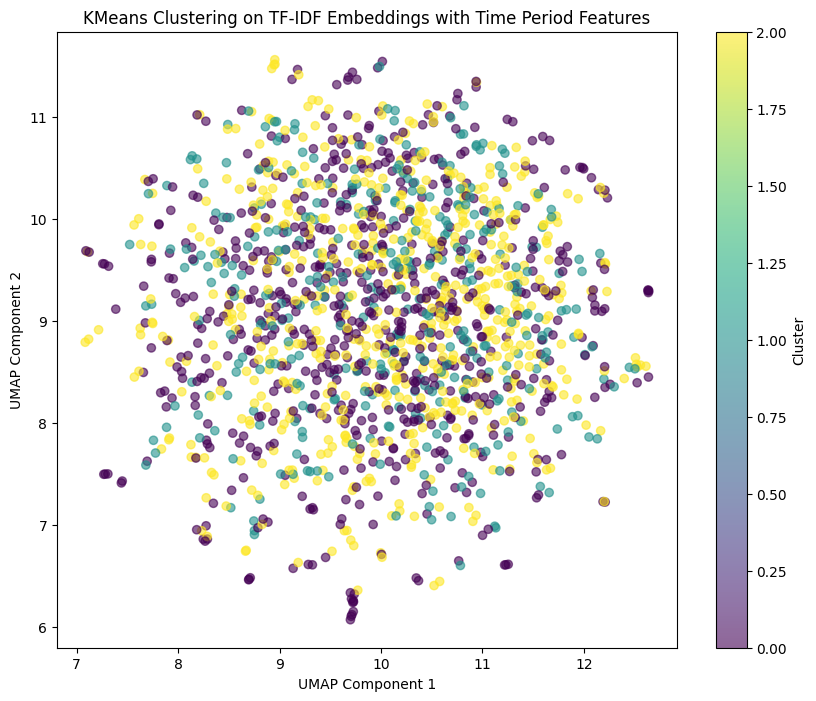


Creating a fallback Matplotlib plot for KMeans Clustering on Word2Vec Embeddings:


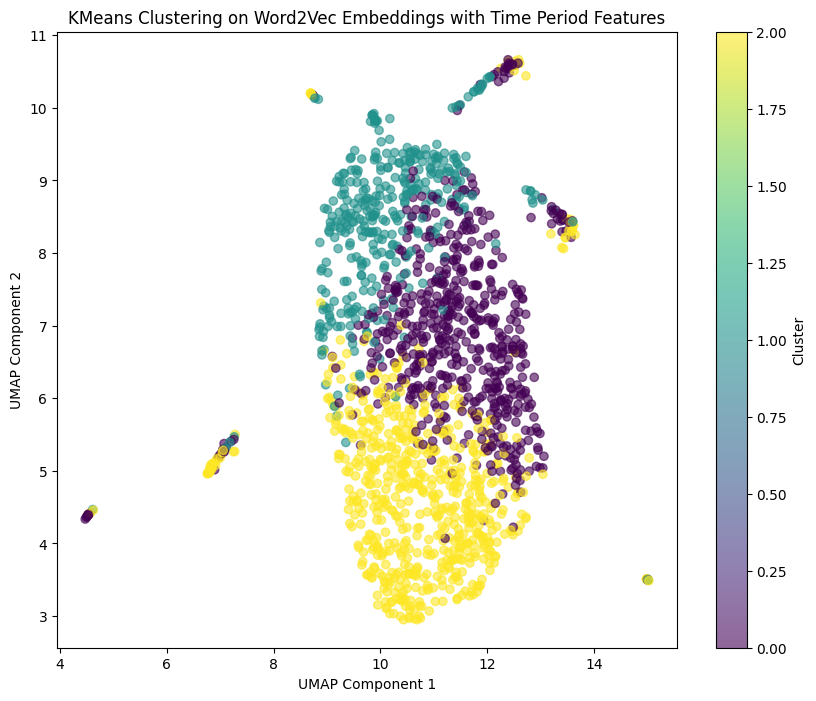

In [20]:
import pandas as pd
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer
from gensim.models import Word2Vec
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.metrics import silhouette_score
import hdbscan
import umap
import plotly.express as px
import matplotlib.pyplot as plt
import warnings

# Suppress warnings for cleaner output
warnings.filterwarnings('ignore')


# -------------------------------Encoding 'Time_Period' with One-Hot Encoding-------------------------------

# Initialize OneHotEncoder
encoder = OneHotEncoder(sparse_output=False, drop='first')  # drop='first' to avoid dummy variable trap

# Fit and transform 'Time_Period'
time_period_encoded = encoder.fit_transform(df1[['Time_Period']])

# Get encoded feature names
encoded_feature_names = encoder.get_feature_names_out(['Time_Period'])

# Convert to DataFrame
time_period_df = pd.DataFrame(time_period_encoded,
                              columns=encoded_feature_names,
                              index=df1.index)

# ------------------------------- TF-IDF Embedding -------------------------------

# Initialize TF-IDF Vectorizer
tfidf_vectorizer = TfidfVectorizer(max_features=1000)  # Adjust max_features as needed

# Fit and transform the cleaned text
tfidf_embeddings = tfidf_vectorizer.fit_transform(df1['clean_text']).toarray()

# Check the shape of the TF-IDF embeddings
print(f"TF-IDF Embeddings Shape: {tfidf_embeddings.shape}")

# Convert TF-IDF embeddings to DataFrame
tfidf_embeddings_df = pd.DataFrame(tfidf_embeddings,
                                   columns=[f'TFIDF_{i}' for i in range(tfidf_embeddings.shape[1])],
                                   index=df1.index)

# ------------------------------- Word2Vec Embedding -------------------------------

# Tokenize the cleaned text
df1['tokens'] = df1['clean_text'].apply(lambda x: x.split())

# Train Word2Vec model
word2vec_model = Word2Vec(
    sentences=df1['tokens'],
    vector_size=100,  # Dimensionality of the word vectors
    window=5,         # Maximum distance between the current and predicted word within a sentence
    min_count=1,      # Ignores all words with total frequency lower than this
    workers=4,        # Number of worker threads to train the model
    epochs=100        # Number of iterations (epochs) over the corpus
)

# Function to create sentence embeddings by averaging word vectors
def get_word2vec_embedding(tokens, model):
    """
    Creates a sentence embedding by averaging its word vectors.

    Parameters:
    - tokens (list): List of words in the sentence.
    - model (Word2Vec): Trained Word2Vec model.

    Returns:
    - np.array: Averaged word vectors representing the sentence.
    """
    # Initialize an empty list to hold word vectors
    word_vectors = []

    for word in tokens:
        if word in model.wv:
            word_vectors.append(model.wv[word])

    if word_vectors:
        # Compute the mean of word vectors
        return np.mean(word_vectors, axis=0)
    else:
        # If no words are found in the vocabulary, return a zero vector
        return np.zeros(model.vector_size)

# Apply the function to create embeddings
df1['word2vec_embedding'] = df1['tokens'].apply(lambda x: get_word2vec_embedding(x, word2vec_model))

# Convert embeddings to a NumPy array
word2vec_embeddings = np.vstack(df1['word2vec_embedding'])
print(f"Word2Vec Embeddings Shape: {word2vec_embeddings.shape}")

# Convert Word2Vec embeddings to DataFrame
word2vec_embeddings_df = pd.DataFrame(word2vec_embeddings,
                                      columns=[f'Word2Vec_{i}' for i in range(word2vec_embeddings.shape[1])],
                                      index=df1.index)

# ------------------------------- Combine Time Period Features with Embeddings -------------------------------

# Combine TF-IDF embeddings with Time Period features
tfidf_combined = pd.concat([tfidf_embeddings_df, time_period_df], axis=1)

# Combine Word2Vec embeddings with Time Period features
word2vec_combined = pd.concat([word2vec_embeddings_df, time_period_df], axis=1)

# ------------------------------- Feature Scaling -------------------------------

# Initialize StandardScaler
scaler = StandardScaler()

# Fit and transform TF-IDF combined features
tfidf_scaled = scaler.fit_transform(tfidf_combined)
tfidf_scaled_df = pd.DataFrame(tfidf_scaled,
                               columns=tfidf_combined.columns,
                               index=df1.index)

# Fit and transform Word2Vec combined features
word2vec_scaled = scaler.fit_transform(word2vec_combined)
word2vec_scaled_df = pd.DataFrame(word2vec_scaled,
                                  columns=word2vec_combined.columns,
                                  index=df1.index)

# ------------------------------- Clustering with Alternative Algorithms -------------------------------

def perform_clustering(embeddings, data_frame, method='KMeans', n_clusters=5, eps=0.3, min_samples=5, embedding_type='TFIDF'):
    """
    Performs clustering using the specified method and computes the silhouette score.

    Parameters:
    - embeddings (np.array): The embedding vectors.
    - data_frame (pd.DataFrame): The DataFrame containing the data.
    - method (str): Clustering method ('DBSCAN', 'KMeans', 'Agglomerative').
    - n_clusters (int): Number of clusters (for KMeans and Agglomerative).
    - eps (float): The maximum distance between two samples for one to be considered as in the neighborhood of the other (for DBSCAN).
    - min_samples (int): The number of samples in a neighborhood for a point to be considered as a core point (for DBSCAN).
    - embedding_type (str): Type of embedding ('TFIDF' or 'Word2Vec').

    Returns:
    - None: Adds cluster labels to the DataFrame and prints silhouette scores.
    """
    try:
        if method == 'DBSCAN':
            clustering = DBSCAN(eps=eps, min_samples=min_samples, metric='euclidean')
            clustering.fit(embeddings)
            cluster_labels = clustering.labels_
            cluster_col = f'{method}_{embedding_type}_cluster'
            data_frame[cluster_col] = cluster_labels
        elif method == 'KMeans':
            clustering = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
            clustering.fit(embeddings)
            cluster_labels = clustering.labels_
            cluster_col = f'{method}_{embedding_type}_cluster'
            data_frame[cluster_col] = cluster_labels
        elif method == 'Agglomerative':
            clustering = AgglomerativeClustering(n_clusters=n_clusters)
            clustering.fit(embeddings)
            cluster_labels = clustering.labels_
            cluster_col = f'{method}_{embedding_type}_cluster'
            data_frame[cluster_col] = cluster_labels
        else:
            print(f"Clustering method '{method}' is not supported.")
            return

        # Check if the cluster column was successfully added
        if cluster_col in data_frame.columns:
            print(f"Cluster column '{cluster_col}' added successfully.")
        else:
            print(f"Failed to add cluster column '{cluster_col}'.")
            return

        # Compute silhouette score (exclude noise points labeled as -1 for DBSCAN)
        if method == 'DBSCAN':
            mask = cluster_labels != -1
            unique_clusters = set(cluster_labels[mask])
            if mask.sum() > 1 and len(unique_clusters) > 1:
                sil_score = silhouette_score(embeddings[mask], cluster_labels[mask])
                print(f"Silhouette Score for {method} + {embedding_type}: {sil_score:.4f}")
            else:
                print(f"{method} did not find enough clusters for {embedding_type} to compute silhouette score.")
        else:
            if len(set(cluster_labels)) > 1:
                sil_score = silhouette_score(embeddings, cluster_labels)
                print(f"Silhouette Score for {method} + {embedding_type}: {sil_score:.4f}")
            else:
                print(f"{method} assigned all samples to a single cluster for {embedding_type}. Silhouette score cannot be computed.")

    except Exception as e:
        print(f"An error occurred during {method} clustering for {embedding_type}: {e}")

# Perform KMeans Clustering on TF-IDF Embeddings
print("\nPerforming KMeans Clustering on TF-IDF Embeddings:")
perform_clustering(tfidf_scaled, df1, method='KMeans', n_clusters=3, embedding_type='TFIDF')

# Perform Agglomerative Clustering on TF-IDF Embeddings
print("\nPerforming Agglomerative Clustering on TF-IDF Embeddings:")
perform_clustering(tfidf_scaled, df1, method='Agglomerative', n_clusters=3, embedding_type='TFIDF')

# Perform DBSCAN Clustering on TF-IDF Embeddings
print("\nPerforming DBSCAN Clustering on TF-IDF Embeddings:")
perform_clustering(tfidf_scaled, df1, method='DBSCAN', eps=0.3, min_samples=5, embedding_type='TFIDF')

# Perform KMeans Clustering on Word2Vec Embeddings
print("\nPerforming KMeans Clustering on Word2Vec Embeddings:")
perform_clustering(word2vec_scaled, df1, method='KMeans', n_clusters=3, embedding_type='Word2Vec')

# Perform Agglomerative Clustering on Word2Vec Embeddings
print("\nPerforming Agglomerative Clustering on Word2Vec Embeddings:")
perform_clustering(word2vec_scaled, df1, method='Agglomerative', n_clusters=3, embedding_type='Word2Vec')

# Perform DBSCAN Clustering on Word2Vec Embeddings
print("\nPerforming DBSCAN Clustering on Word2Vec Embeddings:")
perform_clustering(word2vec_scaled, df1, method='DBSCAN', eps=0.3, min_samples=5, embedding_type='Word2Vec')

# -------------------------------Dimensionality Reduction with UMAP for Visualization-------------------------------

# Initialize UMAP
reducer = umap.UMAP(n_components=2, random_state=42, n_neighbors=15, min_dist=0.1, metric='euclidean')

# Fit and transform TF-IDF combined scaled features
print("\nApplying UMAP to TF-IDF Combined Features...")
tfidf_umap = reducer.fit_transform(tfidf_scaled)

# Add UMAP results to the DataFrame
df1['UMAP_TFIDF_1'] = tfidf_umap[:, 0]
df1['UMAP_TFIDF_2'] = tfidf_umap[:, 1]

# Fit and transform Word2Vec combined scaled features
print("Applying UMAP to Word2Vec Combined Features...")
word2vec_umap = reducer.fit_transform(word2vec_scaled)

# Add UMAP results to the DataFrame
df1['UMAP_Word2Vec_1'] = word2vec_umap[:, 0]
df1['UMAP_Word2Vec_2'] = word2vec_umap[:, 1]

# ------------------------------- Visualization with Plotly -------------------------------

def plot_clusters(data_frame, x_col, y_col, cluster_col, title):
    """
    Plots clusters using Plotly.

    Parameters:
    - data_frame (pd.DataFrame): The DataFrame containing the data.
    - x_col (str): Column name for the x-axis.
    - y_col (str): Column name for the y-axis.
    - cluster_col (str): Column name for cluster labels.
    - title (str): Title of the plot.

    Returns:
    - None: Displays the Plotly scatter plot.
    """
    if cluster_col not in data_frame.columns:
        print(f"Error: Column '{cluster_col}' does not exist in the DataFrame.")
        return

    # Handle noise points for DBSCAN by assigning a separate color
    if 'DBSCAN' in cluster_col:
        data_frame['cluster_plot'] = data_frame[cluster_col].apply(lambda x: 'Noise' if x == -1 else f'Cluster {x}')
    else:
        data_frame['cluster_plot'] = data_frame[cluster_col].astype(str)

    # Define a custom color palette to ensure enough colors for clusters
    unique_clusters = data_frame['cluster_plot'].unique()
    num_clusters = len(unique_clusters)

    # Use Plotly's qualitative palette which can handle up to 20 distinct categories
    color_palette = px.colors.qualitative.Plotly
    if num_clusters > len(color_palette):
        color_palette = color_palette * (math.ceil(num_clusters / len(color_palette)))

    fig = px.scatter(
        data_frame,
        x=x_col,
        y=y_col,
        color='cluster_plot',
        hover_data=['Primary Artist', 'Track Name', 'Album Name', 'Release Year'],
        title=title,
        labels={x_col: 'UMAP Component 1', y_col: 'UMAP Component 2'},
        color_discrete_sequence=color_palette[:num_clusters],
        opacity=0.8,
        size_max=15,
        render_mode='webgl'  # Improve performance for large datasets
    )
    fig.update_layout(
        width=1200,
        height=800,
        legend_title_text='Cluster'
    )
    fig.show()

# Plot KMeans Clustering on TF-IDF Embeddings
print("\nVisualizing KMeans Clustering on TF-IDF Embeddings:")
plot_clusters(
    data_frame=df1,
    x_col='UMAP_TFIDF_1',
    y_col='UMAP_TFIDF_2',
    cluster_col='KMeans_TFIDF_cluster',
    title='KMeans Clustering on TF-IDF Embeddings with Time Period Features'
)

# Plot Agglomerative Clustering on TF-IDF Embeddings
print("\nVisualizing Agglomerative Clustering on TF-IDF Embeddings:")
plot_clusters(
    data_frame=df1,
    x_col='UMAP_TFIDF_1',
    y_col='UMAP_TFIDF_2',
    cluster_col='Agglomerative_TFIDF_cluster',
    title='Agglomerative Clustering on TF-IDF Embeddings with Time Period Features'
)

# Plot DBSCAN Clustering on TF-IDF Embeddings
print("\nVisualizing DBSCAN Clustering on TF-IDF Embeddings:")
plot_clusters(
    data_frame=df1,
    x_col='UMAP_TFIDF_1',
    y_col='UMAP_TFIDF_2',
    cluster_col='DBSCAN_TFIDF_cluster',
    title='DBSCAN Clustering on TF-IDF Embeddings with Time Period Features'
)

# Plot KMeans Clustering on Word2Vec Embeddings
print("\nVisualizing KMeans Clustering on Word2Vec Embeddings:")
plot_clusters(
    data_frame=df1,
    x_col='UMAP_Word2Vec_1',
    y_col='UMAP_Word2Vec_2',
    cluster_col='KMeans_Word2Vec_cluster',
    title='KMeans Clustering on Word2Vec Embeddings with Time Period Features'
)

# Plot Agglomerative Clustering on Word2Vec Embeddings
print("\nVisualizing Agglomerative Clustering on Word2Vec Embeddings:")
plot_clusters(
    data_frame=df1,
    x_col='UMAP_Word2Vec_1',
    y_col='UMAP_Word2Vec_2',
    cluster_col='Agglomerative_Word2Vec_cluster',
    title='Agglomerative Clustering on Word2Vec Embeddings with Time Period Features'
)

# Plot DBSCAN Clustering on Word2Vec Embeddings
print("\nVisualizing DBSCAN Clustering on Word2Vec Embeddings:")
plot_clusters(
    data_frame=df1,
    x_col='UMAP_Word2Vec_1',
    y_col='UMAP_Word2Vec_2',
    cluster_col='DBSCAN_Word2Vec_cluster',
    title='DBSCAN Clustering on Word2Vec Embeddings with Time Period Features'
)

# ------------------------------- Additional Diagnostic Steps -------------------------------

# **a. Check Number of Samples**
print(f"\nNumber of samples in df1: {len(df1)}")

# **b. Verify Cluster Columns Exist**
print("\nCluster Columns in df1:")
cluster_columns = [col for col in df1.columns if 'cluster' in col]
print(cluster_columns)

# **c. Inspect Cluster Assignments**
print("\nSample Cluster Assignments:")
print(df1[['Track Name', 'Primary Artist'] + cluster_columns].head())

# **d. Plot UMAP Embeddings Colored by Time Period (Sanity Check)**
print("\nVisualizing UMAP Embeddings Colored by Time Period:")
fig = px.scatter(
    df1,
    x='UMAP_TFIDF_1',
    y='UMAP_TFIDF_2',
    hover_data=['Primary Artist', 'Track Name'],
    title='UMAP Projection Colored by Time Period',
    labels={'UMAP_TFIDF_1': 'UMAP Component 1', 'UMAP_TFIDF_2': 'UMAP Component 2'},
    color='Time_Period',  # Color by Time Period for comparison
    color_discrete_sequence=px.colors.qualitative.Set1,  # Use a distinct palette
    opacity=0.6,
    size_max=15,
    render_mode='webgl'
)
fig.update_layout(width=1200, height=800, legend_title_text='Time Period')
fig.show()

# **e. Attempt Plotting with Matplotlib as a Fallback**
print("\nCreating a fallback Matplotlib plot for KMeans Clustering on TF-IDF Embeddings:")
plt.figure(figsize=(10, 8))
scatter = plt.scatter(df1['UMAP_TFIDF_1'], df1['UMAP_TFIDF_2'],
                      c=df1['KMeans_TFIDF_cluster'],
                      cmap='viridis', alpha=0.6)
plt.title('KMeans Clustering on TF-IDF Embeddings with Time Period Features')
plt.xlabel('UMAP Component 1')
plt.ylabel('UMAP Component 2')
plt.colorbar(scatter, label='Cluster')
plt.show()

print("\nCreating a fallback Matplotlib plot for KMeans Clustering on Word2Vec Embeddings:")
plt.figure(figsize=(10, 8))
scatter = plt.scatter(df1['UMAP_Word2Vec_1'], df1['UMAP_Word2Vec_2'],
                      c=df1['KMeans_Word2Vec_cluster'],
                      cmap='viridis', alpha=0.6)
plt.title('KMeans Clustering on Word2Vec Embeddings with Time Period Features')
plt.xlabel('UMAP Component 1')
plt.ylabel('UMAP Component 2')
plt.colorbar(scatter, label='Cluster')
plt.show()


In [21]:
print(df1.columns)

Index(['level_0', 'level_1', 'track_name_similarity', 'artist_similarity',
       'Track URI', 'Track Name', 'Artist URI(s)', 'Artist Name(s)',
       'Album URI', 'Album Name',
       ...
       'KMeans_TFIDF_cluster', 'Agglomerative_TFIDF_cluster',
       'DBSCAN_TFIDF_cluster', 'KMeans_Word2Vec_cluster',
       'Agglomerative_Word2Vec_cluster', 'DBSCAN_Word2Vec_cluster',
       'UMAP_TFIDF_1', 'UMAP_TFIDF_2', 'UMAP_Word2Vec_1', 'UMAP_Word2Vec_2'],
      dtype='object', length=104)


In [22]:
# Recommender system with sbert embeddings final implementation
# Combine SBERT Embeddings and Time_Period Features with Original Selected Features

# Define the original feature selection (ensure commas are properly placed)
features = [
    'Danceability', 'Energy', 'Acousticness',
    'Valence', 'Speechiness', 'Liveness',
    'Loudness', 'Age_of_Song',
    'Major_Label', 'Explicit',
    'energy_valence_interaction', 'dance_energy_interaction',
    'overall_mood', 'is_instrumental',  # Use 'is_instrumental' instead of 'Instrumentalness'
    'Genre_Other',  # Ensure 'Genre_Other' is included
    'Artist_Popularity'
]

# Identify the dummy variable column names
genre_columns = [col for col in df1.columns if col.startswith('Genre_')]
tempo_columns = [col for col in df1.columns if col.startswith('tempo_')]
duration_columns = [col for col in df1.columns if col.startswith('duration_')]

# Add genre, tempo, and duration dummy columns to features
features += genre_columns + tempo_columns + duration_columns

# Extract original features
original_features = df1[features]

# Combine original features with SBERT embeddings and Time_Period features
combined_features = pd.concat([original_features, sbert_embeddings, time_period_df], axis=1)

# ------------------------------- Feature Scaling -------------------------------

# Initialize StandardScaler
scaler = StandardScaler()

# Fit and transform combined features
features_scaled = scaler.fit_transform(combined_features)

# Convert scaled features back to a DataFrame
combined_scaled_df = pd.DataFrame(features_scaled,
                                  columns=combined_features.columns,
                                  index=combined_features.index)

# ------------------------------- Recommend Similar Songs Function with Enhanced Features -------------------------------

def recommend_similar_songs(top_n=10, score_threshold=75):
    """
    Recommend similar songs based on user input using fuzzy matching and Euclidean distance.

    Parameters:
    - top_n (int): Number of similar songs to recommend.
    - score_threshold (int): Minimum score for fuzzy matching (0-100).

    Returns:
    - recommended_songs (pd.DataFrame): DataFrame of recommended songs.
    """
    # Ask user for song name (required) and artist name (optional)
    while True:
        song_name_input = input("Enter the name of the song (required): ").strip()
        if song_name_input:
            break
        else:
            print("Song name cannot be empty. Please enter a valid song name.")

    artist_name_input = input("Enter the artist name (optional): ").strip()

    # Ask user for number of recommendations
    while True:
        try:
            top_n_input = input(f"Enter the number of recommendations you want (default {top_n}): ").strip()
            top_n_user = int(top_n_input) if top_n_input else top_n
            if top_n_user > 0:
                break
            else:
                print("Please enter a positive integer for the number of recommendations.")
        except ValueError:
            print("Invalid input. Please enter a valid integer for the number of recommendations.")

    # Initialize variables
    matched_song_name = None
    matched_artist_name = None
    song_indices = []

    # Fuzzy matching for song name
    song_names = df1['Track Name'].unique()
    song_match = process.extractOne(song_name_input, song_names, scorer=fuzz.token_sort_ratio, score_cutoff=score_threshold)

    if song_match:
        matched_song_name = song_match[0]
        print(f"\nMatched Song: '{matched_song_name}' with score {song_match[1]}")
        # Get all indices of the matched song
        song_indices = df1[df1['Track Name'] == matched_song_name].index.tolist()
    else:
        print(f"\nNo close match found for the song '{song_name_input}'.")
        if not artist_name_input:
            print("Since no artist name is provided, cannot proceed with recommendations.")
            return pd.DataFrame()  # Exit if no artist name provided

    # Fuzzy matching for artist name if provided
    if artist_name_input:
        artist_names = df1['Primary Artist'].unique()
        artist_match = process.extractOne(artist_name_input, artist_names, scorer=fuzz.token_sort_ratio, score_cutoff=score_threshold)

        if artist_match:
            matched_artist_name = artist_match[0]
            print(f"Matched Artist: '{matched_artist_name}' with score {artist_match[1]}")
            if song_indices:
                # Filter songs by matched song name and matched artist name
                song_indices = df1[
                    (df1['Track Name'] == matched_song_name) &
                    (df1['Primary Artist'] == matched_artist_name)
                ].index.tolist()
                if not song_indices:
                    print(f"No songs found for '{matched_song_name}' by '{matched_artist_name}'.")
                    return pd.DataFrame()
            else:
                # Get all song indices for the matched artist
                song_indices = df1[df1['Primary Artist'] == matched_artist_name].index.tolist()
        else:
            print(f"No close match found for the artist '{artist_name_input}'.")
            if not song_name_input:
                print("Since no song name is provided, cannot proceed with recommendations.")
                return pd.DataFrame()  # Exit if no song name provided

    # Aggregate all relevant song indices based on inputs
    if song_indices:
        # If both song and artist are matched
        if matched_song_name and matched_artist_name:
            print(f"\nUsing songs by '{matched_artist_name}' titled '{matched_song_name}' for recommendations.")
        elif matched_song_name:
            print(f"\nUsing songs titled '{matched_song_name}' for recommendations.")
        elif matched_artist_name:
            print(f"\nUsing songs by '{matched_artist_name}' for recommendations.")
    else:
        # If no specific song or artist matched, consider all songs
        print("\nProceeding with recommendations based on the entire dataset.")
        song_indices = list(range(len(df1)))

    # If multiple songs are matched (e.g., multiple songs by the same artist), average their feature vectors
    if len(song_indices) > 1:
        song_feature_vectors = combined_scaled_df.iloc[song_indices].values
        song_feature_vector = np.mean(song_feature_vectors, axis=0)
    elif len(song_indices) == 1:
        song_feature_vector = combined_scaled_df.iloc[song_indices[0]].values
    else:
        print("No songs found for the given inputs.")
        return pd.DataFrame()

    # Compute Euclidean distances
    distances = np.linalg.norm(combined_scaled_df.values - song_feature_vector, axis=1)
    similar_song_indices = np.argsort(distances)

    # Exclude the input songs from the recommendations
    if song_indices:
        similar_song_indices = [idx for idx in similar_song_indices if idx not in song_indices]

    # Ensure indices are within bounds
    similar_song_indices = [i for i in similar_song_indices if 0 <= i < len(df1)]

    # Get top N recommendations
    top_indices = similar_song_indices[:top_n_user]

    # Retrieve song details
    recommended_songs = df1.iloc[top_indices][['Track Name', 'Artist Name(s)', 'Album Name']]

    # Display recommendations
    if not recommended_songs.empty:
        print(f"\nRecommended Songs (Top {top_n_user}):")
        for idx, row in recommended_songs.iterrows():
            print(f"- '{row['Track Name']}' by {row['Artist Name(s)']} from the album '{row['Album Name']}'")
    else:
        print("\nNo recommendations found.")

    return recommended_songs



In [23]:
# To use the recommender, simply call the function
recommend_similar_songs()

Enter the name of the song (required): toxic
Enter the artist name (optional): britayn spar
Enter the number of recommendations you want (default 10): 15

No close match found for the song 'toxic'.
Matched Artist: 'Britney Spears' with score 77

Using songs by 'Britney Spears' for recommendations.

Recommended Songs (Top 15):
- 'All I Have (feat. LL Cool J)' by Jennifer Lopez, LL COOL J from the album 'This Is Me...Then'
- 'Losing Grip' by Avril Lavigne from the album 'Let Go'
- 'Heartbreaker (feat. Jay-Z)' by Mariah Carey, JAY-Z from the album 'Rainbow'
- 'I'm Your Baby Tonight' by Whitney Houston from the album 'I'm Your Baby Tonight'
- 'Right Place Right Time' by Olly Murs from the album 'Right Place Right Time'
- 'Freedom' by Wham! from the album 'Make It Big'
- 'Kiss Me' by Olly Murs from the album 'Never Been Better (Special Edition)'
- 'I Do Not Hook Up' by Kelly Clarkson from the album 'All I Ever Wanted'
- 'Why Can't This Be Love - 2004 Remaster' by Van Halen from the album 'T

,Track Name,Artist Name(s),Album Name
1252,All I Have (feat. LL Cool J),"Jennifer Lopez, LL COOL J",This Is Me...Then
88,Losing Grip,Avril Lavigne,Let Go
1200,Heartbreaker (feat. Jay-Z),"Mariah Carey, JAY-Z",Rainbow
1444,I'm Your Baby Tonight,Whitney Houston,I'm Your Baby Tonight
1335,Right Place Right Time,Olly Murs,Right Place Right Time
13,Freedom,Wham!,Make It Big
268,Kiss Me,Olly Murs,Never Been Better (Special Edition)
817,I Do Not Hook Up,Kelly Clarkson,All I Ever Wanted
792,Why Can't This Be Love - 2004 Remaster,Van Halen,The Very Best of Van Halen (UK Release)
561,"Fastlove, Pt. 1",George Michael,Older
